# Семинар 8. UMAP, SVM

In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image
import requests
import pandas as pd
import itertools
import math
from sklearn.gaussian_process import kernels
from ipywidgets import Video

In [ ]:
import gdown

# download helper function
def download_with_shared_id(file_id, filename):
    url = f"https://drive.google.com/uc?export=download&id={file_id}"
    gdown.download(url, filename, quiet=False)

# UMAP

1. [Документация](https://umap-learn.readthedocs.io/en/latest/index.html)
2. [Understanding UMAP](https://pair-code.github.io/understanding-umap/)
3. [A deeper dive into UMAP theory](https://pair-code.github.io/understanding-umap/supplement.html)
4. [A deeeeper dive into UMAP theory](https://pair-code.github.io/understanding-umap/supplement.html)
5. Оригинальная статья 🤯: https://arxiv.org/pdf/1802.03426
6. Один из наиболее современных методов понижения размерности.
7. [Статья](https://arxiv.org/pdf/2501.07729) от 2025 года
    * Использование Автоэнкодера для получения сжатых информативных признаковых описаний
    * UMAP для последующего сжатия размерности
    * K-mean/DBSCAN для финальной кластеризации.

## Цель



### Анализ данных

Кластеризация -- отличный способ анализа данных.

Рассмотрим пример с [Fashion MNIST](https://www.kaggle.com/datasets/zalando-research/fashionmnist)

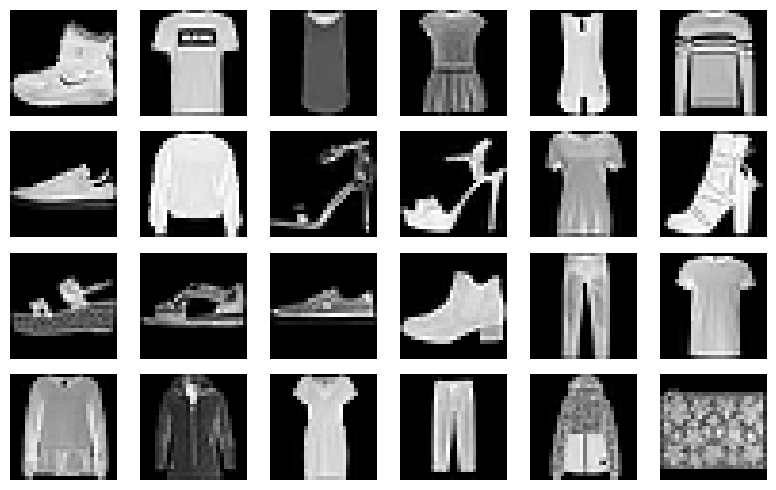

In [ ]:
from torchvision import datasets as tdatasets
from torchvision import transforms

def fashion_mnist():
    mnist_train = tdatasets.FashionMNIST(root='./data', train=True, download=True, transform=transforms.ToTensor())

    batch = mnist_train.data[:24]
    fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(8, 5))
    for i, ax in enumerate(axes.flat):
        ax.imshow(batch[i], cmap='gray')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

    X_train = mnist_train.data.view(-1, 28*28).numpy()
    y_train = mnist_train.targets.numpy().astype(int)
    X_train = X_train / 255.
    return X_train, y_train

X_train, y_train = fashion_mnist()


* Датасет содежит много изображений, нам дана мета-информация о датасете: метки, описание изображений итп
* Как убедиться, что в датасете нет выбросов, например, изображения телефона. Можно кластеризовать датасет, тогда выбросы будут явно видны.
* Опыт подсказывает нам, что футболка ближе к рубашкам и платью (по семантике), а сандали к ботинкам.
* Но что ближе: Футболка к сумке или ботинок к сумке?

t-SNE [не адресует](https://pair-code.github.io/understanding-umap/) к глобальной структуре данных.



### Вычислительная сложность

Вычислительная сложность t-SNE $\mathcal{O}(n^2)$ - это много для реальных наборов данных. [Ускорения](https://arborjs.org/docs/barnes-hut) t-SNE дают $\mathcal{O}(n\log n)$. Но даже это вычислительно-затратно для реальных высокоразмерных данных с большим количеством примеров:

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [ ]:
pca = PCA(n_components=30)
pca_X = pca.fit_transform(X_train)
pca.explained_variance_ratio_.sum()

np.float64(0.8207394504088917)

In [ ]:
%%time
tsne = TSNE(n_components=2, perplexity=40)
tsne_X = tsne.fit_transform(pca_X)

CPU times: user 25min 5s, sys: 48.6 s, total: 25min 53s
Wall time: 27min 22s


* В UMAP же сложность алгоритма ограничена сложностью поиска соседей в графе.
* Существует множество эффективных масштабируемых алгоритмов такого поиска ([NN-descent](https://www.cs.princeton.edu/cass/papers/www11.pdf), [Annoy](https://arxiv.org/pdf/1610.02455), [FAISS](https://arxiv.org/pdf/1702.08734)).
* В результате эмпирическая сложность сводится к $\mathcal{O}(n^{1.14})$, $n$ - число примеров.



In [ ]:
!pip install umap-learn

In [ ]:
from umap.umap_ import UMAP
from sklearn.model_selection import train_test_split

X_mnist_train, X_mnist_test, labels_mnist_train, labels_mnist_test = train_test_split(X_train, y_train, test_size=50)

In [ ]:
%%time
model = UMAP(n_components=2).fit(X_mnist_train)
X_umap_train = model.transform(X_mnist_train)

CPU times: user 2min 37s, sys: 3.45 s, total: 2min 41s
Wall time: 2min 38s


Обратите внимание, в отличие от t-SNE мы также обучались на оригинальной размерности FashionMNIST.

### Математическое обоснование

t-SNE не адресует к глобальной структуре данных, потому что он не пытается её описать. "Похожесть кластерной структуры" определяется в терминах близости входного $P_i$ и моделируемого $Q_i$ распределений:
$$
\mathcal{L} = \sum_{i=1}^n KL(P_i, Q_i) = \sum_{i=1}^n\sum_{j=1}^n p_{j|i}\log\frac{p_{j|i}}{q_{j|i}} \rightarrow \min_{y_1, \ldots y_n}
$$

Из этой оптимизационной задачи явно следует, почему межкластерная структура проекции игнорируется. Если мы возьмём 2 примера $i$, $j$, из разных кластеров, то по определению $p_{j|i} \approx 0$: $p_{j|i}$ - степень соседства примеров. Если примеры далеки, они с вероятностью, близкой к нулю будут соседями

Если $p_{j|i} \approx 0$, то $KL(p_{j|i}, q_{j|i}) ≈ 0$ для любых $q_{j|i}$, что оптимально в терминах оптимизируемой задачи.

Самое сложное в методах понижения размерности - описать **структуру (многообразие)** высокоразмерных данных.

## M - Manifold

Но что же такое [многообразие](https://en.wikipedia.org/wiki/Manifold)?

In [ ]:
Image(url='https://i.sstatic.net/NXLlV.png', width=800)

Для анализа данных гораздо понятнее воспринимать многообразие как форму, которую принимают точки в d-мерном пространстве.

Пример с окружностью

In [ ]:
manim = '1BOaLlsDtaXjLoZLmpjzWgAtkdialDRXc'
download_with_shared_id(manim, 'manifold_1d.mp4')
Video.from_file('manifold_1d.mp4')

Downloading...
From: https://drive.google.com/uc?export=download&id=1BOaLlsDtaXjLoZLmpjzWgAtkdialDRXc
To: /content/manifold_1d.mp4
100%|██████████| 525k/525k [00:00<00:00, 83.5MB/s]


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x07\xeb\xc3mdat\x0…

Пример MNIST

In [ ]:
manim = '1_t6C7sjQ7V9cnLvYf5UKKeIARrtvf0nI'
download_with_shared_id(manim, 'manifold_mnist.mp4')
Video.from_file('manifold_mnist.mp4')

Downloading...
From: https://drive.google.com/uc?export=download&id=1_t6C7sjQ7V9cnLvYf5UKKeIARrtvf0nI
To: /content/manifold_mnist.mp4
100%|██████████| 1.04M/1.04M [00:00<00:00, 39.0MB/s]


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x0f\xb6\xccmdat\x0…

Формально говоря, нам не обязательно определять многообразие как множество каких-то точек по определённому (конкретному) правилу.

Например, более строгое описание [многообразия окружности](https://en.wikipedia.org/wiki/Manifold#Circle) предполагает разбиение на *карты* (charts) $(U_{\alpha}, x_\alpha)$, которые составляют [*атлас*](https://ru.wikipedia.org/wiki/%D0%90%D1%82%D0%BB%D0%B0%D1%81_(%D1%82%D0%BE%D0%BF%D0%BE%D0%BB%D0%BE%D0%B3%D0%B8%D1%8F)) $\{(U_{\alpha}, x_\alpha)\}_\alpha$, покрывающий окружность.

В таком представлении мы можем обращаться к локальным особенностям для описания глобальной структуры.

In [ ]:
Image(url='https://upload.wikimedia.org/wikipedia/commons/6/64/Circle_with_overlapping_manifold_charts.svg', width=300)

В этом смысле многообразие можно воспринимать как область, которая в некотором масштабе воспроизводит Евклидово пространство: см. первое предложение [определения](https://en.wikipedia.org/wiki/Manifold).

В случае с окружностью, такую локальность можно воспринимать как предельный переход от правильного $n$-угольника: в локальном масштабе расстояние между двумя точками можно с достаточной точностью описать отрезком $\subset \mathbb{R}^1$.

### Topological Data Analysis

Пусть у нас есть данные $X \in \mathbb{R}^{n\times d}$. Каждый сэмпл $x_i$ можно отобразить в виде точки в многомерном пространстве $\mathbb{R}^d$ (the ambient space).

Какую описать форму точек $x_i$ в $\mathbb{R}^d$? Этим занимается [Гомология](https://en.wikipedia.org/wiki/Homology_(mathematics))

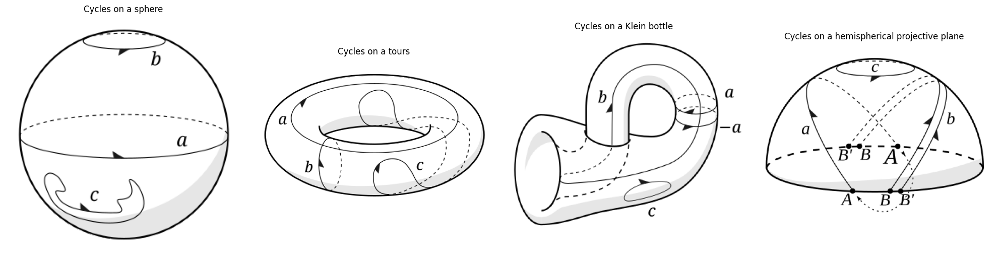

In [ ]:
import matplotlib.pyplot as plt
import urllib.request
from PIL import Image
import io

def composite_plot(urls, map_names):
    fig, axes = plt.subplots(1, len(urls), figsize=(5 * len(urls), 5))
    for i, (ax, url) in enumerate(zip(axes, urls)):
        with urllib.request.urlopen(url) as response:
            image_data = response.read()
        image = Image.open(io.BytesIO(image_data))
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(map_names[i+1])

    plt.tight_layout()
    plt.show()

urls = [
    "https://upload.wikimedia.org/wikipedia/commons/thumb/2/2b/Spherecycles1.svg/282px-Spherecycles1.svg.png",
    "https://upload.wikimedia.org/wikipedia/commons/thumb/6/67/Toruscycles1.svg/452px-Toruscycles1.svg.png",
    "https://upload.wikimedia.org/wikipedia/commons/thumb/2/23/Kleincycles1.svg/340px-Kleincycles1.svg.png",
    "https://upload.wikimedia.org/wikipedia/en/thumb/5/5a/Projectivecycles2.svg/378px-Projectivecycles2.svg.png"
]
map_names = {1: 'Cycles on a sphere',
             2: 'Cycles on a tours',
             3: 'Cycles on a Klein bottle',
             4: 'Cycles on a hemispherical projective plane'}
composite_plot(urls, map_names)

### Как определять характеристики поверхности?

Треугольники! (полигональное покрытие)

Пример с MNIST показал, что зачастую описать многообразие в виде множества невозможно. Но это и не требуется. Достаточно обращаться к локальным особенностям в данных для описания глобальной структуры.

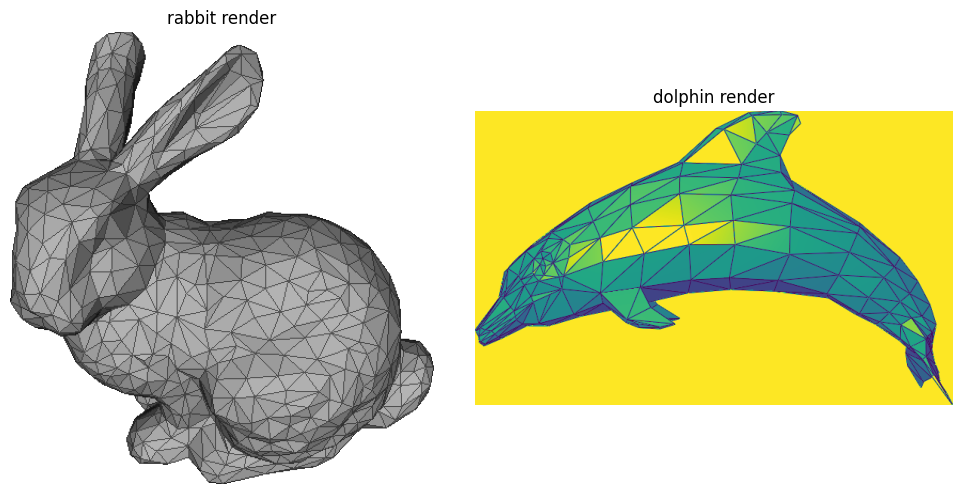

In [ ]:
render_urls = ['https://www.lix.polytechnique.fr/~maks/Verona_MPAM/TD/TD2/images/snapshot00.png',
               'https://upload.wikimedia.org/wikipedia/commons/f/fb/Dolphin_triangle_mesh.png']
map_render_names = {1: 'rabbit render', 2: 'dolphin render'}
composite_plot(render_urls, map_render_names)

Обощением являются симплексы

In [ ]:
Image(url='https://i.sstatic.net/O6xtg.png', width=800)

### Как строить полигональные покрытия?

Такая процедура называется фильтрацией (filtration)

In [ ]:
Image(url='https://www.researchgate.net/publication/331793357/figure/fig3/AS:11431281272446038@1724104691020/Simplicial-complex-forming-over-increasing-proximity-parameter-e-Points-are-joined-into.tif', width=1000)

Иллюстрация имеет следующую логику: если область внутри ребер закрашена - это двумерный симплекс. На рисунке (С) у нас 2 двумерных симплекса, 4 одномерных и один 0-мерный.

Как видно из (С), Покрытия можно собирать разными размерностями симплексов

In [ ]:
Image(url='https://www.researchgate.net/publication/349067888/figure/fig4/AS:1021430967840774@1620539528972/Basic-simplexes-and-simplicial-complex-construction-in-a-given-radius-of-filtration-a.ppm', width=700)

Но как определить, симплексом какой размерности "покрывать" $k$ точек?

### Симплексные комплексы (Simplicial Complexes)

#### Теорема Нерва

Основная "математическая обоснованность" UMAP лежит в [теореме Нерва](https://en.wikipedia.org/wiki/Nerve_complex).

Давайте вернёмся к определению многообразия $\mathcal{M}$

In [ ]:
Image(url='https://i.sstatic.net/NXLlV.png', width=800)

Грубо говоря, многообразие описывается некоторыми "картами" (charts) $\{U_\alpha\}_\alpha$ (см. пример с окружностью).

Давайте выделим некоторое произвольное семейство $C = \{U_i\}_{i\in I} \subset \{U_\alpha\}_\alpha$.

Тогда, в некотором смысле (гомотопично) объединение $\bigcup C$
эквивалентно $\mathcal{M}$.

Определим *нерв* семейства $C$
$$
N(C) := \left\{J \subseteq I \,:\, \bigcap_{j\in J} U_j \neq ∅, \quad J \,\,\text{is finite set}\right\}
$$
Т.е. это все конечные подмножества, в которых пересечение не пусто.

Мы вольны определять, как задавать различные $C$. **Теорема Нерва** даёт *достаточные* условия на $C$, гарантирующие, что $N(C)$ эквивалентно (гомотопично) многообразию $\mathcal{M}$.

Интуитивно, это следует из того, что многообразие $\mathcal{M}$ локально воспроизводит Евклидово пространство $\mathbb{R}^d$. Если мы "корректно" зададим $C$, то $N(C)$ сможет "комбинаторно" (конечными множествами) в достаточно масштабе описать Евклидово пространство и "покрыть" многообразие.

**Причем здесь симплексы?**

#### Čech Simplicial Complex

Данные можно представить как облако точек $x_i \in X$. Это облако заведомо-конечно, мы можем выбрать покрытие $C_r = \{\mathcal{B}(x_i, r) | x_i \in X\}$. Тогда нерв $C_r$:
$$
N(C_r) := \left\{J \subseteq I \,:\, \bigcap_{j\in J} \mathcal{B}(x_j, r) \neq ∅, \quad J \,\,\text{is finite set}\right\}.
$$

Данное покрытие называется **Čech Cover** и соответствующий нерв **Čech Nerve.** Для Čech Nerve выполнима Теорема Нерва, т.е. такое покрытие эквивалентно многообразию $\mathcal{M}$.

Из определения нерва $C_r$:
* $|J| = 1 \Rightarrow \cap_{j\in J} \mathcal{B}(x_j, r) = \mathcal{B}(x_{j_0}, r) \neq ∅$. Точка всегда входит в нерв. *Это 0-симплекс*
* $|J| = 2 \in N(C_r) ⇔ \mathcal{B}(x_{j_0}, r) \cap \mathcal{B}(x_{j_1}, r) \neq ∅$. Тогда $x_{j_0}$ и $x_{j_1}$ - *Это 1-симплекс*.
* В общем случае $\{x_0, \ldots x_k\}$ - k-1-симплекс $⇔ \cap_{i=1}^k \mathcal{B}(x_i, r) \neq ∅$.

Мы построили **Čech Simplicial Complex!** Основное правило, по которому строится высокоразмерный граф с математическим обоснованием приближения многообразия 🤗.

Давайте снова взглянем на процедуру фильтрации

In [ ]:
Image(url='https://www.researchgate.net/publication/331793357/figure/fig3/AS:11431281272446038@1724104691020/Simplicial-complex-forming-over-increasing-proximity-parameter-e-Points-are-joined-into.tif', width=1000)

Согласитесь, эти кружочки теперь выглядят осмысленнее.

**Почему именно кружочки (Čech Simplicial Complex) ?**

Разве покрытие $C_r = \{\mathcal{B}(x_i, r) | x_i \in X\}$ единственное, которое удовлетворяет теореме Нерва?

Конечно, нет:


* [Leray Nerve](https://en.wikipedia.org/wiki/Nerve_complex#Leray's_nerve_theorem);
* [Borsuk Nerve](https://en.wikipedia.org/wiki/Nerve_complex#Borsuk's_nerve_theorem);
* [Homological Nerve](https://en.wikipedia.org/wiki/Nerve_complex#Homological_nerve_theorem).

Тогда почему именно Čech Nerve?

Все дело в структуре нашего многообразия $x_i \in X \subset \mathcal{M}$ - облако точек высокой размерности, которых много. UMAP во многом адресует к вычислительной эффективности t-SNE, поэтому покрытие должно быть вычислительно-эффективным.

Čech Nerve - простейший топологический комплекс, который строится из попарных расстояний между объектами

#### Čech Implementation

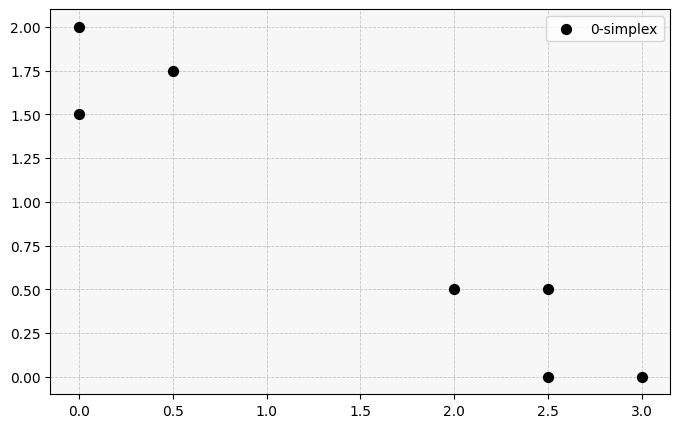

In [ ]:
def plot_points(points, figsize=(8, 5), point_color='k', point_size=50, background_color='#f7f7f7'):
    fig, ax = plt.subplots(figsize=figsize)
    ax.scatter(points[:, 0], points[:, 1], c=point_color, s=point_size, zorder=5, label='0-simplex')
    ax.grid(
        True,
        linestyle='--',
        linewidth=0.6,
        alpha=0.7
    )
    ax.set_facecolor(background_color)
    return fig, ax

points = np.array([
    [0.0, 2.0],
    [0.0, 1.5],
    [0.5, 1.75],
    [2.0, 0.5],
    [2.5, 0.5],
    [2.5, 0.0],
    [3.0, 0.0]
])
fig, ax = plot_points(points)
ax.legend()
plt.show()

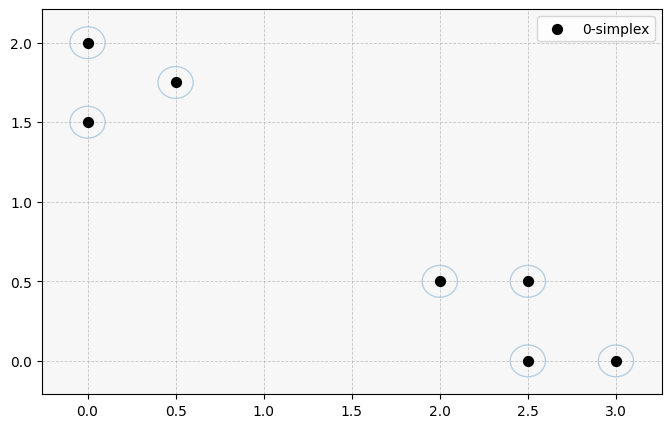

In [ ]:
def add_circles(ax, centers, radius, color='C0', alpha=0.3):
    for center in centers:
        circle = plt.Circle(center, radius, facecolor='none', alpha=alpha, edgecolor=color)
        ax.add_patch(circle)

fig, ax = plot_points(points)
add_circles(ax, points, radius=0.1)
ax.legend()
plt.show()

Имплементируем построение симплексов по Čech Nerve до 3-симплекса

1-симплекс - простая проверка расстояний.

In [ ]:
def first_order_simplex(p, q):
    center = (p + q) / 2
    return center, np.linalg.norm(p - center)

2-симплекс - есть много способов определить пересечение 3-х окружностей. Однако воспользуемся тем, что имеет обобщение на случай k-симплекса

In [ ]:
Image(url='https://i.sstatic.net/G8M1k.jpg', width=600)

У окружностей с центрами $A$, $B$, $C$ и радиусом $r$ есть общая точка $O$, если $\max_{X\in\{A, B, C\}}\|O - X\| \leqslant r$.

Если пересечение окружностей - область $\mathcal{O}$, то для пересечения окружностей достаточно, чтобы $\min_{O\in\mathcal{O}}\max_{X\in\{A, B, C\}}\|O - X\| \leqslant r$.

Минимум такой задачи находится в центре "минимального покрывающего круга" (minimum enclosing circle) - это видно и из диаграммы и верно в случае большего числа окружностей.

Таким образом, для 3-х окружностей достаточно определить радиус описанной окружности вокруг центровых точек $A$, $B$, $C$:
$$
R = \dfrac{d_{AB}\cdot d_{BC} \cdot d_{AC}}{4S},
$$
где площадь $S$ можно определить по формуле Герона.

In [ ]:
def second_order_simplex(p, q, r):
    d_pq = np.linalg.norm(p - q)
    d_pr = np.linalg.norm(p - r)
    d_qr = np.linalg.norm(q - r)
    a, b, c = d_qr, d_pr, d_pq
    s = 0.5 * (a + b + c)
    A = math.sqrt(max(s * (s - a) * (s - b) * (s - c), 0.0))

    if A == 0 or (c**2 > a**2 + b**2) or (b**2 > a**2 + c**2) or (a**2 > b**2 + c**2):
        pts = {d_pq: (p, q), d_pr: (p, r), d_qr: (q, r)}
        d_max = max(pts)
        u, v = pts[d_max]
        center = (u + v) / 2
        return center, d_max / 2

    ux = ((np.dot(q - p, q - p) * (r - p)[1] - np.dot(r - p, r - p) * (q - p)[1]) / (4 * A))
    uy = ((np.dot(r - p, r - p) * (q - p)[0] - np.dot(q - p, q - p) * (r - p)[0]) / (4 * A))
    center = p + np.array([ux, uy])
    return center, np.linalg.norm(p - center)

Таким образом, для проверки что $\{x_0, \ldots x_k\}$ - k-1-симплекс $⇔ \cap_{i=1}^k \mathcal{B}(x_i, r) \neq ∅$ нам достаточно уметь строить минимальную покрывающую окружность для произвольных $k$ точек.

Это можно сделать с помощью [Welzl’s algorithm](https://people.inf.ethz.ch/emo/PublFiles/SmallEnclDisk_LNCS555_91.pdf).

In [ ]:
def _ball_from(R):
    R = list(R)
    if not R:
        return np.zeros(2), 0.0
    if len(R) == 1:
        # 0-simplex
        return np.array(R[0]), 0.0
    if len(R) == 2:
        # 1-simplex
        return first_order_simplex(*R)
    if len(R) == 3:
        # 2-simplex
        return second_order_simplex(*R)
    P = np.vstack(R)
    A = P[1:] - P[0]
    b = 0.5 * (np.sum(P[1:]**2, axis=1) - np.sum(P[0]**2))
    # k-simplex -- solve SLE
    center = np.linalg.lstsq(A, b, rcond=None)[0]
    radius = np.linalg.norm(P[0] - center)
    return center, radius



def _welzl(P, R):
    if not P or len(R) == P[0].shape[0] + 1:
        return _ball_from(R)
    p = P.pop()
    center, rad = _welzl(P, R)
    if np.linalg.norm(p - center) <= rad + 1e-8:
        P.append(p)
        return center, rad
    R.append(p)
    center, rad = _welzl(P, R)
    R.pop()
    P.append(p)
    return center, rad

In [ ]:
def k_order_simplex(points):
    P = list(points.copy())
    np.random.shuffle(P)
    center, r = _welzl(P, [])
    return center, r

Наконец, Čech-Complex implementation!

Проводим только до 3-симплекса для удобства визуализации.

In [ ]:
def cech_complex(points, r):
    n = len(points)
    # Edges (1-simplex)
    edges = []
    for i, j in itertools.combinations(range(n), 2):
        _, R = first_order_simplex(points[i], points[j])
        if R <= r:
            edges.append((i, j))

    # Triangles (2-simplex)
    triangles = []
    for i, j, k in itertools.combinations(range(n), 3):
        _, R = second_order_simplex(points[i], points[j], points[k])
        if R <= r:
            triangles.append((i, j, k))

    # Tetrahedrons (3-simplex)
    tetras = []
    for i, j, k, l in itertools.combinations(range(n), 4):
        _, R = k_order_simplex(np.array([points[i], points[j], points[k], points[l]]))
        if R <= r:
            tetras.append((i, j, k, l))
    return {'edges': edges, 'triangles': triangles, 'tetras': tetras}

Визуализация симплексов

In [ ]:
def compute_point_dims(n_points, complex_dict):
    dims = [0]*n_points
    for i,j       in complex_dict['edges']:     dims[i]=max(dims[i],1); dims[j]=max(dims[j],1)
    for i,j,k     in complex_dict['triangles']: dims[i]=max(dims[i],2); dims[j]=max(dims[j],2); dims[k]=max(dims[k],2)
    for i,j,k,l   in complex_dict['tetras']:    dims[i]=max(dims[i],3); dims[j]=max(dims[j],3); dims[k]=max(dims[k],3); dims[l]=max(dims[l],3)
    return dims

def plot_complex_by_point(fig, ax, points, complex_dict, r_circle):
    dims = compute_point_dims(len(points), complex_dict)

    # always draw radius circles (outline) for all points
    for idx in range(len(points)):
        circ = plt.Circle(points[idx], r_circle,
                      facecolor='none', edgecolor='k', linestyle='--', linewidth=1.2,
                      zorder=4)
        ax.add_patch(circ)

    simplices = []
    # 0‑simplices → filled circles
    for idx, d in enumerate(dims):
        if d == 0:
            if '0' not in simplices:
                label = '0-simplex'
                simplices.append('0')
            else:
                label = None
            ax.add_patch(plt.Circle(points[idx], r_circle,
                                 facecolor='C5', edgecolor='k', alpha=0.4, zorder=6, label=label))

    # 1‑simplices → solid edges
    for i,j in complex_dict['edges']:
        if dims[i]==1 and dims[j]==1:
            if '1' not in simplices:
                label = '1-simplex'
                simplices.append('1')
            else:
                label = None
            ax.plot(*zip(points[i], points[j]),
                    color='C2', linewidth=2, zorder=5, label=label)

    # 2‑simplices → filled triangles
    for tri in complex_dict['triangles']:
        if all(dims[v]==2 for v in tri):
            verts = points[list(tri)]
            if '2' not in simplices:
                label = '2-simplex'
                simplices.append('2')
            else:
                label = None
            ax.add_patch(plt.Polygon(verts, facecolor='C3', edgecolor='k', alpha=0.3, zorder=3, label=label))

    # 3‑simplices → dotted tetra edges
    for tet in complex_dict['tetras']:
        if all(dims[v]==3 for v in tet):
            for i,j in itertools.combinations(tet,2):
                if '3' not in simplices:
                    label = '3-simplex'
                    simplices.append('3')
                else:
                    label = None
                ax.plot(*zip(points[i], points[j]),
                        linestyle=':', linewidth=1, color='C1', zorder=2, label=label)

    # add legend for radius
    # create a dummy circle patch for legend
    # legend_circle = plt.Circle((0,0), r_circle, facecolor='none', edgecolor='k', linestyle='--', linewidth=1.2)
    handles, labels = ax.get_legend_handles_labels()
    # handles.append(legend_circle)
    # labels.append(f'Radius = {r_circle}')
    ax.legend(handles, labels, loc='upper right')
    ax.set_aspect('equal', 'box')
    return fig, ax

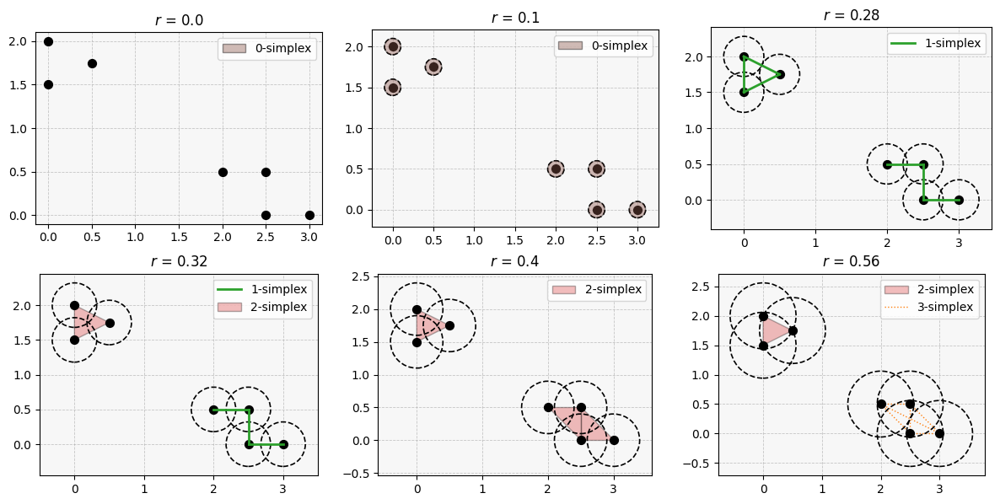

In [ ]:
r_vals = [0.0, 0.1, 0.28, 0.32, 0.4, 0.56]
point_color='k'
point_size=50
background_color='#f7f7f7'

fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout=False)
axes = axes.flatten()
for idx, r in enumerate(r_vals):
    ax = axes[idx]
    cech = cech_complex(points, r)
    ax.clear()

    ax.scatter(points[:, 0], points[:, 1], c=point_color, s=point_size, zorder=5)
    ax.grid(
        True,
        linestyle='--',
        linewidth=0.6,
        alpha=0.7
    )
    ax.set_facecolor(background_color)
    plot_complex_by_point(fig, ax, points, cech, r)
    ax.set_title(f"$r$ = {r}", fontsize=12)

plt.tight_layout()
plt.show()

Čech Complex Time: 25.1209 seconds


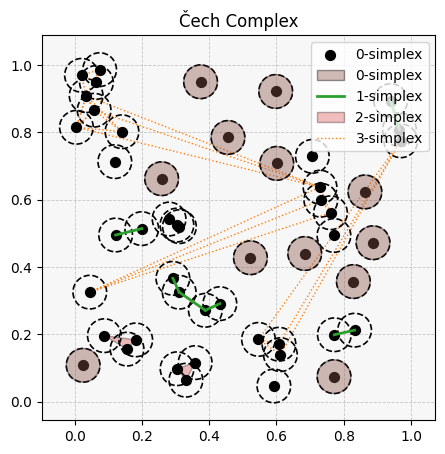

In [ ]:
import time

np.random.seed(42)
cloud_points = np.random.rand(50, 2)
r = 0.05

start = time.time()
cech = cech_complex(cloud_points, r)
cech_time = time.time() - start

print(f"Čech Complex Time: {cech_time:.4f} seconds")

fig, ax = plot_points(cloud_points)
plot_complex_by_point(fig, ax, cloud_points, cech, r_circle=r)
plt.title("Čech Complex")
plt.show()

Как видим, даже для 50 синтетических 2-D точек построение Čech-Complex требует значительного времени, хотя мы ограничиваемся лишь 3-симплексом и, вроде как, это простейший топологический комплекс, который строится из попарных расстояний между объектами 😞

Несостыковки в построении 3-симплекса вызваны рандомизацией в Welzl Алгоритме

#### Vietoris–Rips Complex

Vietoris–Rips Complex является аппроксимацией Čech-Complex для $0$ и $1$-симплексов. Симплексы более высоких порядков $k$ определяются просто $k+1$-кликами в графе на точках:

$$
X_{k+1} = \{x_0, \ldots x_{k+1}\} \in S_{k}(1) ⇔ \max_{x, y \in X_{k+1}} d(x, y) \leqslant r
$$

В результате облако данных $X$ представляется в виде графа с вершинами в сэмплах и ребрами - 1-симплексами.

In [ ]:
Image(url='https://i.sstatic.net/H1vuM.png', width=600)

In [ ]:
# ——— Utility: pairwise distance matrix ———
def distance_matrix(points):
    pts = np.asarray(points)
    n = len(pts)
    D = np.zeros((n, n))
    for i in range(n):
        for j in range(i+1, n):
            D[i, j] = D[j, i] = np.linalg.norm(pts[i] - pts[j])
    return D

def rips_complex(points, r):
    D = distance_matrix(points)
    n = len(points)
    edges = [(i,j) for i,j in itertools.combinations(range(n),2) if D[i,j] <= 2*r]
    triangles = [(i,j,k)
                 for i,j,k in itertools.combinations(range(n),3)
                 if D[i,j] <= 2*r and D[i,k] <= 2*r and D[j,k] <= 2*r]
    tetras = [(i,j,k,l)
              for i,j,k,l in itertools.combinations(range(n),4)
              if all(D[a,b] <= 2*r
                     for a,b in itertools.combinations((i,j,k,l),2))]
    return {'edges': edges, 'triangles': triangles, 'tetras': tetras}

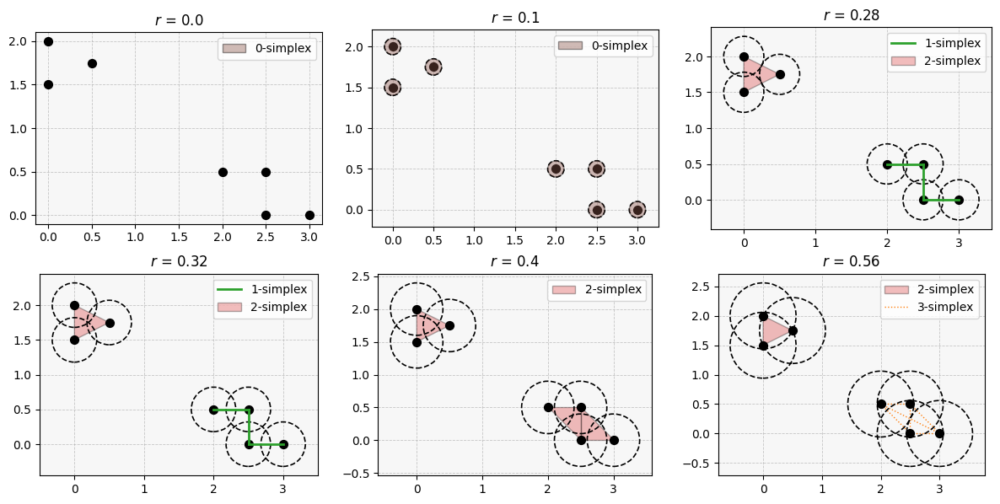

In [ ]:
r_vals = [0.0, 0.1, 0.28, 0.32, 0.4, 0.56]
point_color='k'
point_size=50
background_color='#f7f7f7'

fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout=False)
axes = axes.flatten()
for idx, r in enumerate(r_vals):
    ax = axes[idx]
    rips = rips_complex(points, r)
    ax.clear()

    ax.scatter(points[:, 0], points[:, 1], c=point_color, s=point_size, zorder=5)
    ax.grid(
        True,
        linestyle='--',
        linewidth=0.6,
        alpha=0.7
    )
    ax.set_facecolor(background_color)
    plot_complex_by_point(fig, ax, points, rips, r)
    ax.set_title(f"$r$ = {r}", fontsize=12)

plt.tight_layout()
plt.show()

Rips Complex Time: 0.2150 seconds


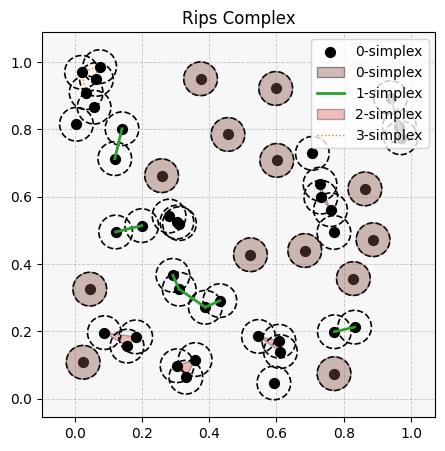

In [ ]:
start = time.time()
r = 0.05
rips = rips_complex(cloud_points, r)
rips_time = time.time() - start
print(f"Rips Complex Time: {rips_time:.4f} seconds")

fig, ax = plot_points(cloud_points)
plot_complex_by_point(fig, ax, cloud_points, rips, r_circle=r)
plt.title("Rips Complex")
plt.show()

### Summary

In [ ]:
Image(url='https://menchelab.com/files/menchelab/research%20media/joel_network.png', width=800)

**Визуализация**

In [ ]:
Image(url='https://raw.githubusercontent.com/giotto-ai/giotto-tda/6f896531b7c59216fd292018bf73728dea40b7e6/examples/images/vietoris_rips_point_cloud.gif', width=500)

## U - Uniform

В примерах выше мы наблюдали, что у Симплексных комплексов есть 1 важный гиперпараметр - радиус окружности, который определяет "соседство" примеров.

Его значение задаёт "разрешение" на котором мы описываем многообразие: большой радиус улавливает глобальные закономерности, но теряет в локальных и наоборот.

Как подобрать радиус окружности корректно?

Если данные на многообразие расположены **равномерно**, то одним радиусом мы захватим одинаковое **число соседей.**

Таким образом, в UMAP вводится первый гиперпараметр (`nearest_neighbour`), вместо радиуса, который является специфичным под каждый датасет и описывает его геометрию/масштаб (вспоминаем DBSCAN).

Более того, Теорема Нерва верна для Čech Complex только в случае равномерного расположения $x_i \in X$

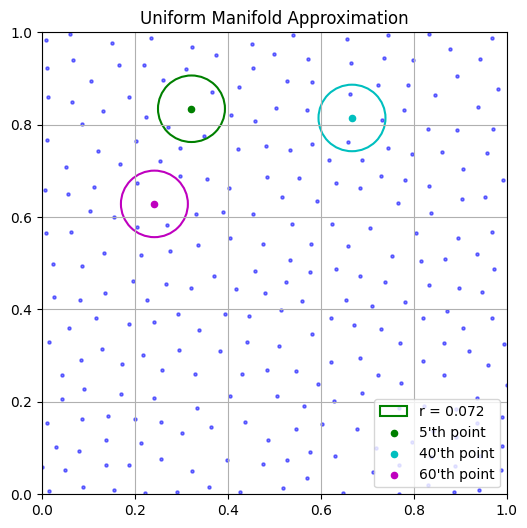

In [ ]:
def poisson_disk_sampling(width=1.0, height=1.0, d=0.05, k=30, seed=42):
    """
    Generate points in [0, width] x [0, height] with minimum distance d using Poisson disk sampling.
    """

    rng = np.random.RandomState(seed)

    cell_size = d / np.sqrt(2)
    grid_cols = int(np.ceil(width / cell_size))
    grid_rows = int(np.ceil(height / cell_size))
    grid = -np.ones((grid_rows, grid_cols), dtype=int)  # Grid to store point indices (-1: empty)

    points = []
    active = []

    initial_point = rng.uniform([0, 0], [width, height])
    points.append(initial_point)
    active.append(0)
    row = int(initial_point[1] / cell_size)
    col = int(initial_point[0] / cell_size)
    grid[row, col] = 0

    def is_valid(candidate, points, grid, cell_size, d, width, height):
        row = int(candidate[1] / cell_size)
        col = int(candidate[0] / cell_size)
        if row < 0 or row >= grid.shape[0] or col < 0 or col >= grid.shape[1]:
            return False
        # Check neighboring cells (up to 2 cells away)
        for i in range(max(0, row - 2), min(grid.shape[0], row + 3)):
            for j in range(max(0, col - 2), min(grid.shape[1], col + 3)):
                idx = grid[i, j]
                if idx != -1:
                    dist = np.linalg.norm(candidate - points[idx])
                    if dist < d:
                        return False
        return True

    while active:
        active_idx = rng.choice(active)
        active_point = points[active_idx]
        found = False
        for _ in range(k):
            theta = rng.uniform(0, 2 * np.pi)
            radius = rng.uniform(d, 2 * d)
            candidate = active_point + np.array([radius * np.cos(theta), radius * np.sin(theta)])
            if (0 <= candidate[0] < width) and (0 <= candidate[1] < height):
                if is_valid(candidate, points, grid, cell_size, d, width, height):
                    points.append(candidate)
                    new_idx = len(points) - 1
                    active.append(new_idx)
                    row = int(candidate[1] / cell_size)
                    col = int(candidate[0] / cell_size)
                    grid[row, col] = new_idx
                    found = True
                    break
        if not found:
            active.remove(active_idx)

    return np.array(points)

def approx_plot(points, mode="Uniform", highlight_indices=[5, 40, 60], highlight_colors=['g', 'c', 'm'], r = [0.072, 0.072, 0.072]):
    # Create the plot
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.scatter(points[:, 0], points[:, 1], s=5, alpha=0.5, color='blue')
    constant_r = all([r[0] == radius for radius in r])

    # Add circles
    for i, idx in enumerate(highlight_indices):
        if i != 0 and constant_r:
            label = None
        else:
            label = f'r = {r[i]}'
        x, y = points[idx]
        circle = plt.Circle((x, y), r[i], edgecolor=highlight_colors[i], facecolor='none', linewidth=1.5, label=label)
        ax.add_patch(circle)
        if constant_r:
            label = f'{idx}\'th point'
        else:
            label = None
        ax.scatter(x, y, s=20, alpha=1, color=highlight_colors[i], label=label)

    ax.set_title(f'{mode} Manifold Approximation')
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.grid(True)
    plt.legend(loc='lower right')
    plt.show()


d = 0.05
poisson_points = poisson_disk_sampling(d=d)
approx_plot(poisson_points)

Однако реальные данные, конечно же, не располагаются равномерно.

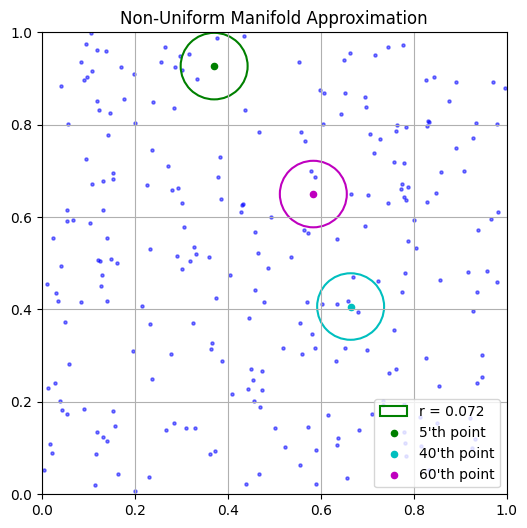

In [ ]:
n_points = 250
seed = 42
rng = np.random.default_rng(seed)
non_uniform_points = rng.random((n_points, 2))
approx_plot(non_uniform_points, mode="Non-Uniform")

Как это решить?

## A - Approximation

In [ ]:
download_with_shared_id(file_id='1LWYbX_RL-MKAtEuVvIFZDki52G1hmmY8', filename='lemma1.png')

Downloading...
From: https://drive.google.com/uc?export=download&id=1LWYbX_RL-MKAtEuVvIFZDki52G1hmmY8
To: /content/lemma1.png
100%|██████████| 72.2k/72.2k [00:00<00:00, 33.3MB/s]


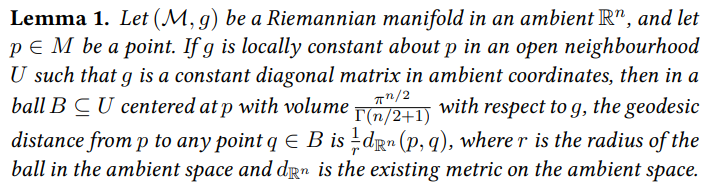

In [ ]:
Image('lemma1.png', width=800)

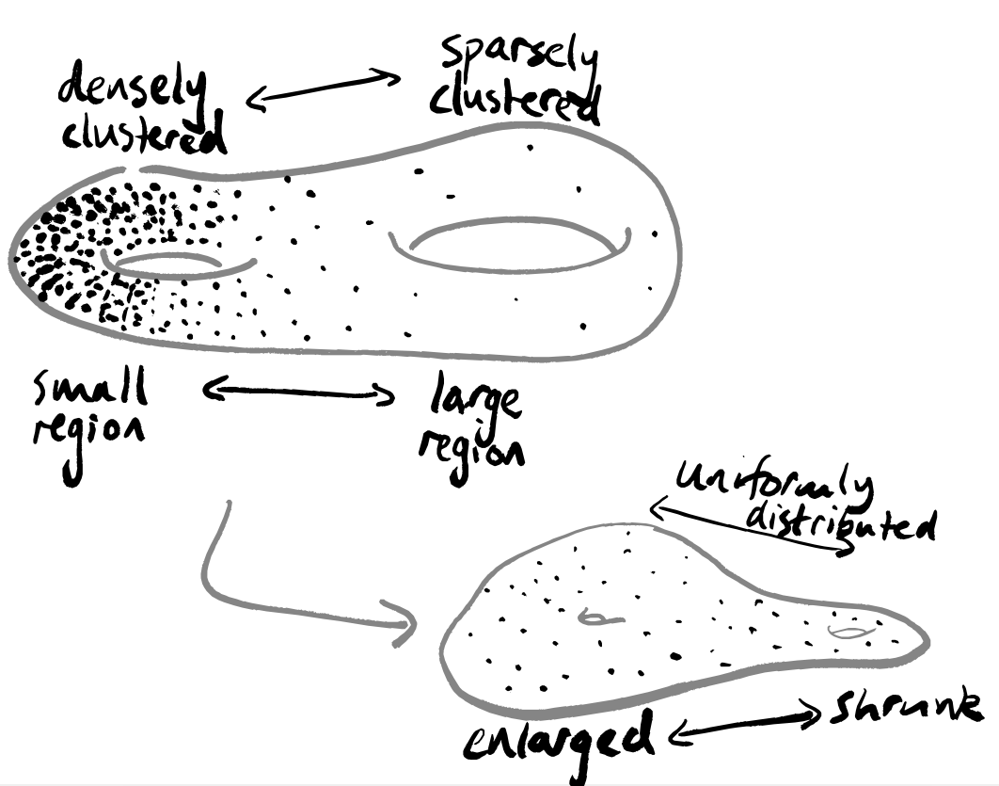

In [ ]:
Image('https://topos.institute/blog/2024-04-05-understanding-umap/images/7-selective-stretching.png', width=800)

Мы можем добиться такой аппроксимации, "адаптируя" геометрию датасета под каждую из рассматриваемых точек.

Давайте для каждой точки выбирать радиус, соответствующий её $k$ соседям

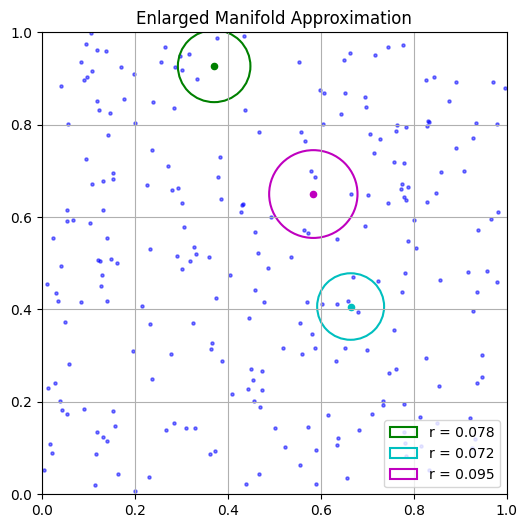

In [ ]:
approx_plot(non_uniform_points, mode="Enlarged", r=[0.078, 0.072, 0.095])

Подбирая специфичный радиус $r_i$ под каждую точку $x_i$, вместо одного покрытия $C_r$ мы получаем множество $\{C_{r_i}\}_{i=1}^N$.

Чтобы специфицировать "геометрию" многообразия под каждую из точек $x_i$, нам нужно определить, как взаимосвязаны покрытия $\{C_{r_i}\}$.

Как мы упоминали, Vietoris–Rips покрытие позволяет представить его в виде графа: ребра являются 1-симплексами.

Тогда, чтобы установить взаимосвязь между графами, которая бы отражала геометрию многообразия, давайте сделаем эти рёбра **взвешенными**. Если для точки $x_i$ ближайшей является $x_j$, из этого не следует, что $x_i = \arg\min_{x\in X}d(x, x_j) ⇒$ граф является еще и  **ориентированным**

#### Как определить веса в ребрах графа?

Можно определить в соответствии с расстоянием до соседа.  Однако в таком случае мы столкнёмся с последствиями "проклятия размерности" на реальных примерах

* Если $x_i, x_j \in \mathbb{R}^d$, то $d(x_i, x_j) \sim d$. Чем больше размерность, тем больше расстояние даже до ближайшего соседа. При этом разница между ближайшим и 2-м соседом будет незначительная.
* Из-за этого многие точки будут *принципиально изолированны*. Это явно препятствует полному покрытию многообразия при объединении $\bigcup C_{r_i}$.



Для этого вводят **local connectivity constraint**.

Пусть $X_i$ содержит $k$ соседей $X_{i_1}, \ldots X_{i_k}$. Ближайший сосед $X_{i_j}$ и $\rho_j = d(X_i, X_{i_j})$. Тогда

$$
\rho(X_i, X_{i_p}) = \exp\left\{-\dfrac{\max[0, d(X_i, X_{i_p}) - \rho_j]}{\sigma_p^2} \right\}.
$$

Это простое экспоненциальное убывание, где ближайшему соседу назначается единичный вес.

Разрешение $\sigma_p^2$ подбираются из условий нормировки (наличие k-соседей)
$$
\sum_{p=1}^k \rho(X_i, X_{i_p}) = \log_2k
$$

In [ ]:
def _k_nearest_neighbors(points, center_idx, k):
    center = points[center_idx]
    diffs = points - center[None, :]
    dists = np.linalg.norm(diffs, axis=1)
    dists[center_idx] = np.inf
    nn_idx = np.argsort(dists)[:k]
    return nn_idx, dists[nn_idx]

def _solve_sigma2_for_target(distances, rho_j, target_sum, tol=1e-6, max_iter=60):
    numerators = np.maximum(0.0, distances - rho_j)
    k = len(distances)
    if np.allclose(numerators, 0.0):
        return float('inf'), float(k)
    min_possible = float(np.sum(numerators == 0.0))
    max_possible = float(k)
    if target_sum <= min_possible:
        return 1e-12, min_possible
    if target_sum >= max_possible:
        return float('inf'), max_possible
    low, high = 1e-12, 1e6
    for _ in range(max_iter):
        mid = (low + high) / 2.0
        vals = np.exp(- numerators / mid)
        s = float(vals.sum())
        if abs(s - target_sum) <= tol:
            return mid, s
        if s > target_sum:
            high = mid
        else:
            low = mid
    mid = (low + high) / 2.0
    vals = np.exp(- numerators / mid)
    return mid, float(vals.sum())

def _negative_exp_weights(distances, rho_j, target_sum=None, desired_max_ratio=None):
    numerators = np.maximum(0.0, distances - rho_j)
    if np.allclose(numerators, 0.0):
        return float('inf'), np.ones_like(distances)
    max_num = numerators.max()
    if target_sum is not None and desired_max_ratio is None:
        sigma2, _ = _solve_sigma2_for_target(distances, rho_j, target_sum)
        raw = np.exp(- numerators / sigma2) if not math.isinf(sigma2) else np.ones_like(distances)
        return sigma2, raw
    if desired_max_ratio is not None and desired_max_ratio > 1.0 and max_num > 0.0:
        sigma2 = max_num / math.log(desired_max_ratio)
        raw = np.exp(- numerators / sigma2)
        return sigma2, raw
    sigma2 = 1.0
    raw = np.exp(- numerators / sigma2)
    return sigma2, raw

def approx_neighbors_plot(points,
                          highlight_indices=[5, 40, 60],
                          highlight_colors=['g', 'c', 'm'],
                          k=8,
                          epsilon_pad=0.05,
                          figsize=(10, 6),
                          mode="Negative-exp",
                          target_sum=None,
                          desired_max_ratio=None):

    assert len(highlight_indices) == len(highlight_colors)
    n_centers = len(highlight_indices)

    fig, axes = plt.subplots(nrows=2, ncols=n_centers, figsize=figsize)
    if n_centers == 1:
        axes = np.array([[axes[0]], [axes[1]]])

    for col, (center_idx, color) in enumerate(zip(highlight_indices, highlight_colors)):
        ax_orig = axes[0, col]
        ax_rew = axes[1, col]

        nn_idx, dists = _k_nearest_neighbors(points, center_idx, k)
        center = points[center_idx].astype(float)
        neigh = points[nn_idx].astype(float)

        rho_j = float(np.min(dists))
        targ = target_sum if target_sum is not None else math.log2(k)

        sigma2, raw = _negative_exp_weights(
            dists, rho_j,
            target_sum=(targ if desired_max_ratio is None else None),
            desired_max_ratio=desired_max_ratio
        )

        sum_raw = float(raw.sum())
        C = (targ / sum_raw) if (targ is not None and sum_raw > 0) else 1.0
        weights = C * raw

        ax = ax_orig
        ax.scatter(points[:, 0], points[:, 1], s=6, alpha=0.25, color='lightgray')
        ax.scatter(neigh[:, 0], neigh[:, 1], s=30, alpha=0.95, color='tab:blue')
        ax.scatter([center[0]], [center[1]], s=80, color=color, edgecolor='k', zorder=5)
        for j, ni in enumerate(nn_idx):
            npt = points[ni]
            ax.plot([center[0], npt[0]], [center[1], npt[1]],
                    linewidth=1.0, alpha=0.8, color=color)
            midx = 0.5 * (center[0] + npt[0]); midy = 0.5 * (center[1] + npt[1])
            ax.text(midx, midy, f"{dists[j]:.3f}", fontsize=8,
                    ha='center', va='center',
                    bbox=dict(facecolor='white', alpha=0.75, edgecolor='none', pad=1.0))

        all_x = np.concatenate(([center[0]], neigh[:, 0]))
        all_y = np.concatenate(([center[1]], neigh[:, 1]))
        dx = max(all_x.max() - all_x.min(), 1e-4)
        dy = max(all_y.max() - all_y.min(), 1e-4)
        ax.set_xlim(all_x.min() - epsilon_pad * dx, all_x.max() + epsilon_pad * dx)
        ax.set_ylim(all_y.min() - epsilon_pad * dy, all_y.max() + epsilon_pad * dy)
        ax.set_title(f"Original Graph")
        ax.grid(True)

        ax = ax_rew
        ax.scatter(points[:, 0], points[:, 1], s=6, alpha=0.25, color='lightgray')
        ax.scatter(neigh[:, 0], neigh[:, 1], s=30, alpha=0.95, color='tab:blue')
        ax.scatter([center[0]], [center[1]], s=80, color=color, edgecolor='k', zorder=5)
        for j, ni in enumerate(nn_idx):
            npt = points[ni]
            ax.plot([center[0], npt[0]], [center[1], npt[1]],
                    linewidth=1.0, alpha=0.9, color=color)
            midx = 0.5 * (center[0] + npt[0]); midy = 0.5 * (center[1] + npt[1])
            ax.text(midx, midy, f"{weights[j]:.3f}", fontsize=8,
                    ha='center', va='center',
                    bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', pad=1.0))

        all_x = np.concatenate(([center[0]], neigh[:, 0]))
        all_y = np.concatenate(([center[1]], neigh[:, 1]))
        dx = max(all_x.max() - all_x.min(), 1e-4)
        dy = max(all_y.max() - all_y.min(), 1e-4)
        ax.set_xlim(all_x.min() - epsilon_pad * dx, all_x.max() + epsilon_pad * dx)
        ax.set_ylim(all_y.min() - epsilon_pad * dy, all_y.max() + epsilon_pad * dy)
        ax.set_title(
            f"Local Connect. Graph σ²={'inf' if math.isinf(sigma2) else f'{sigma2:.2g}'}"
        )
        ax.grid(True)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

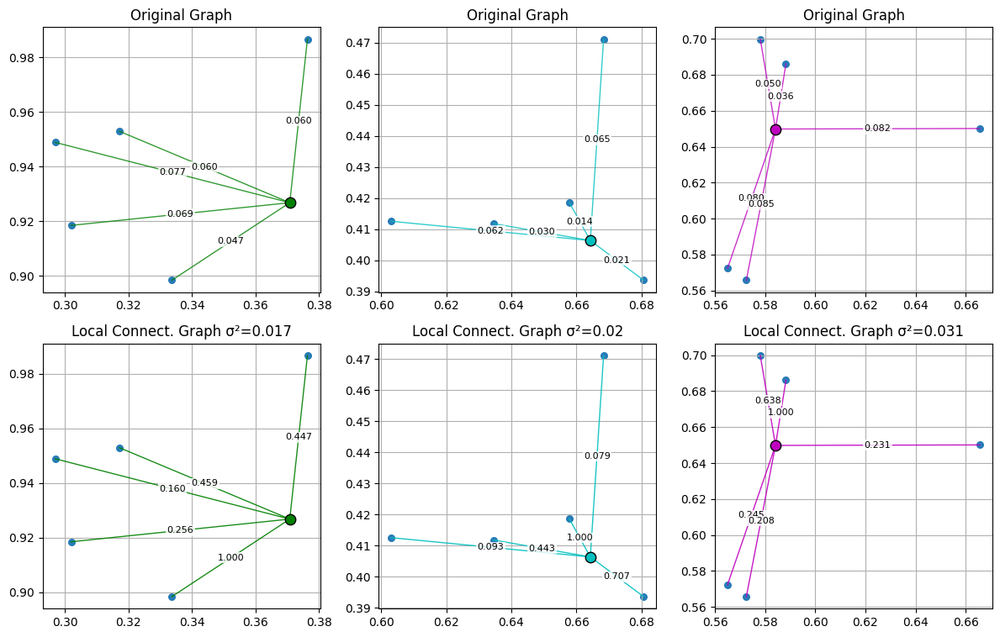

In [ ]:
approx_neighbors_plot(non_uniform_points, k=5, figsize=(12, 8))

Таким образом для точки $X_i$ мы можем построить ориентированный взвешенный граф, который подходящим образом описывает структуру датасета относительно неё.

Далее имеем $N$ таких графов

#### Как объединить графы?

In [ ]:
download_with_shared_id(file_id='1YDctuijB5BUMiCIfqzVnDqU-UpLG6A8w', filename='theorem1.png')

Downloading...
From: https://drive.google.com/uc?export=download&id=1YDctuijB5BUMiCIfqzVnDqU-UpLG6A8w
To: /content/theorem1.png
100%|██████████| 34.5k/34.5k [00:00<00:00, 39.3MB/s]


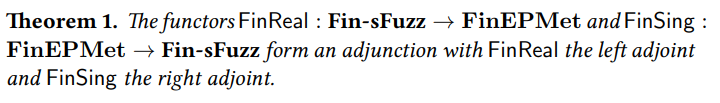

In [ ]:
Image('theorem1.png', width=800)

In [ ]:
download_with_shared_id(file_id='1HYNWAflpvl-UaS03MRM2_mutDOGHgIaG', filename='fuzzy_simplicial_complex.png')

Downloading...
From: https://drive.google.com/uc?export=download&id=1HYNWAflpvl-UaS03MRM2_mutDOGHgIaG
To: /content/fuzzy_simplicial_complex.png
100%|██████████| 884k/884k [00:00<00:00, 83.1MB/s]


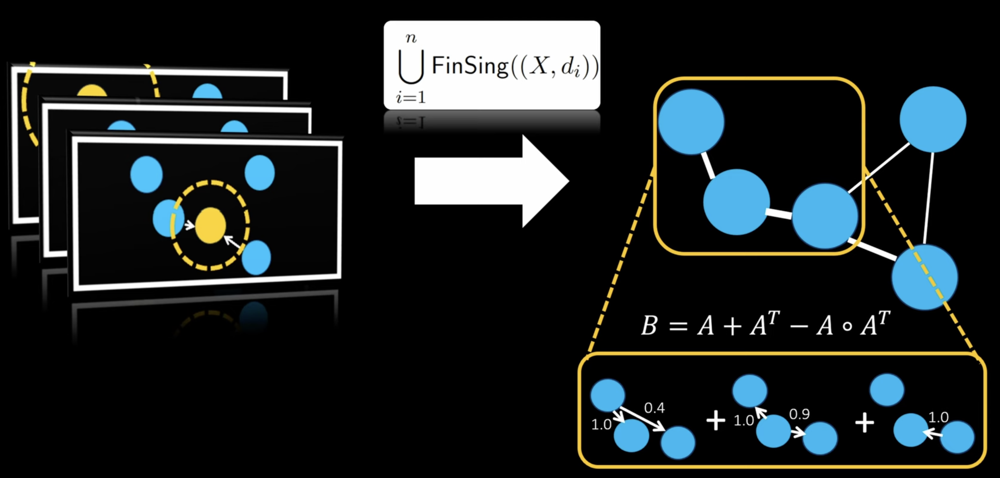

In [ ]:
Image('fuzzy_simplicial_complex.png', width=800)

На практике Теорема 1 представляет правило, по которому можно объединять графы.

Из построения следует, что $x_i$ и $x_j$ могут быть связаны ребром только в покрытиях $C_{r_i}$ и $C_{r_j}$ (но необязательно в обоих). В результате процедура объединения сводится к получению из *ориентированных* графов *неориентированного*.

Для этого веса графов можно интерпретировать как вероятности. Тогда неориентированное ребро - это вероятность "объединить" ориентированные рёбра, которая получается из вероятности объединения событий

$$
P(x_i - x_j) = P(\{x_i \rightarrow x_j \} \cup \{x_j \rightarrow x_i\}) = P(\{x_i \rightarrow x_j \}) + P(\{x_j \rightarrow x_i \}) - P(\{x_i \rightarrow x_j \})P(\{x_j \rightarrow x_i \}).
$$

В примере выше:
* $P(x_1 - x_2) = 1.0$;
* $P(x_1 - x_3) = 0.4 + 0.0 - 0 = 0.4 < 0.5$;
* $P(x_2 - x_3) = 1.0 + 0.9 - 0.9 = 1.0$.

In [ ]:
download_with_shared_id(file_id='1ONuQM0f_zoS7K86lDf-8Ag0xdGaAUNWD', filename='graph_construction_pipeline.png')

Downloading...
From: https://drive.google.com/uc?export=download&id=1ONuQM0f_zoS7K86lDf-8Ag0xdGaAUNWD
To: /content/graph_construction_pipeline.png
100%|██████████| 1.18M/1.18M [00:00<00:00, 58.1MB/s]


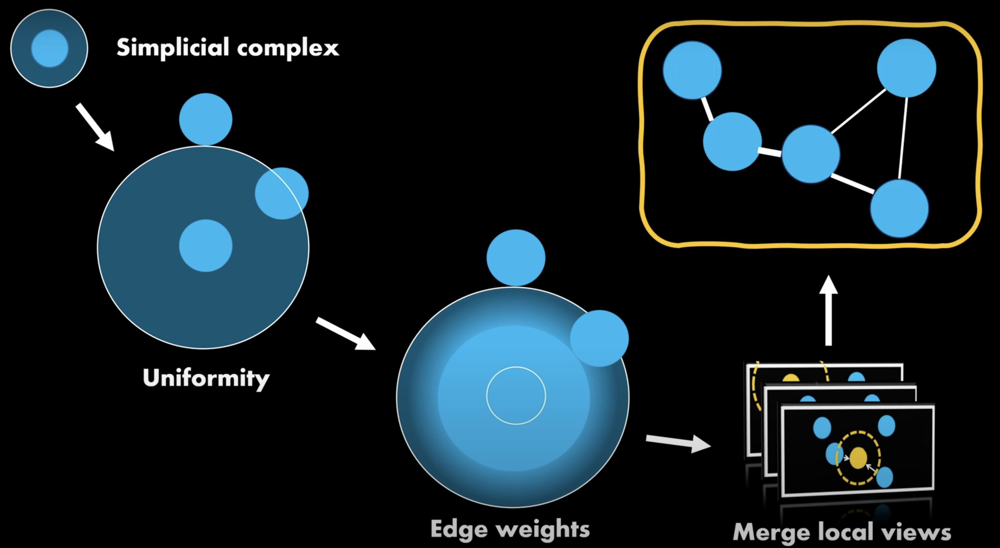

In [ ]:
Image('graph_construction_pipeline.png', width=800)

## P - Projection

Отобразить полученный высокоразмерный граф в низкоразмерное представление гораздо понятнее :)

In [ ]:
download_with_shared_id(file_id='1MPwwECDUpU2RESBUAjvWL48QRi5CdzUG', filename='graph_comparison.png')

Downloading...
From: https://drive.google.com/uc?export=download&id=1MPwwECDUpU2RESBUAjvWL48QRi5CdzUG
To: /content/graph_comparison.png
100%|██████████| 147k/147k [00:00<00:00, 31.4MB/s]


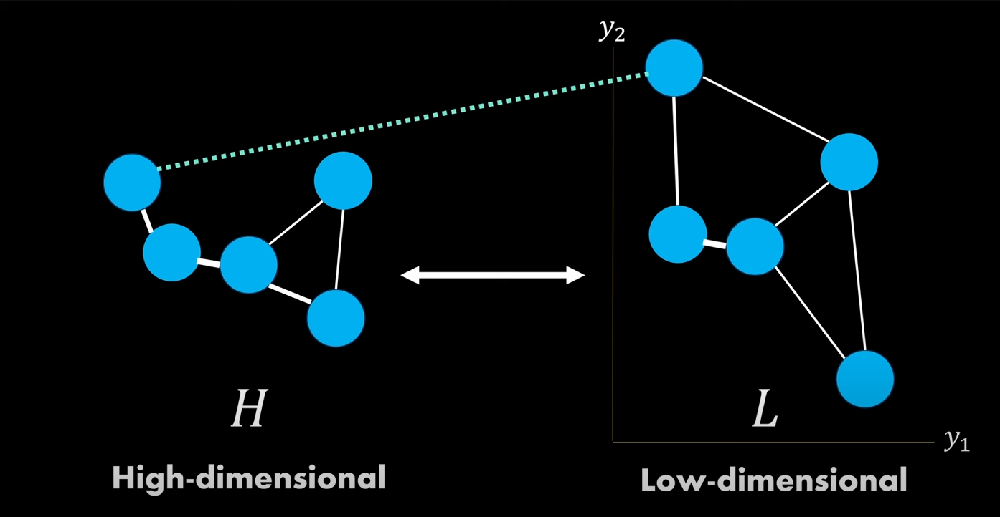

In [ ]:
Image('graph_comparison.png', width=800)

* Чем более "похожие" графы, тем лучше проецирование.
* В общем случае сравнение графов - нетривиальная задача.
* Но у нас есть одна сильная особенность, которая всё упрощает: узлы должны повторяться, тк они соответствуют конкретным примерам.
* В результате критерием расположения вершин графа является схожесть их рёбер.
* Или, что тоже самое, близость матриц смежности.
* Поскольку ребра в high-dimensional графе представляют вероятности, можно напрямую оптимизировать бинарной кросс энтропией:
$$
\sum_{e\in E}\left[ w_h(e)\log\dfrac{w_h(e)}{w_l(e)} + (1 - w_h(e)) \log\dfrac{(1 - w_h(e))}{(1 - w_l(e))}\right]
$$

С деталями инициализации графа и регуляризацией на координаты $y_1$, $y_2$ можно ознакомиться в статье.



## Weaknesses

Как и всякие основополагающие работы, UMAP не лишены скромности в обсуждении своих слабостей

* Как и всякие нелинейные методы понижения размерности (t-SNE, Isomap), у UMAP есть сильной интерпретируемости, что есть у PCA и подобных матричных разложений. Это может быть критичным в анализе данных
* UMAP аппроксимирует аппроксимацию многообразия :) UMAP предполагает наличие многообразия у данных $X$, таким образом предполагает, что $X$ хорошо описывает $\mathcal{M}$, чтобы полученное приближение $Y$ также хорошо его описывало.
* UMAP как и t-SNE нацелен на локальную структуру данных, поскольку закладывает что близкие расстояния более важные, чем дальние.
* UMAP деформирует представление данных к равномерному. Если структура критически важна, это может негативно сказаться на финальной аппроксимации



## UMAP Examples

### MNIST

In [ ]:
!pip install umap-learn

100%|██████████| 9.91M/9.91M [00:00<00:00, 44.2MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 1.63MB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 12.5MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 7.16MB/s]


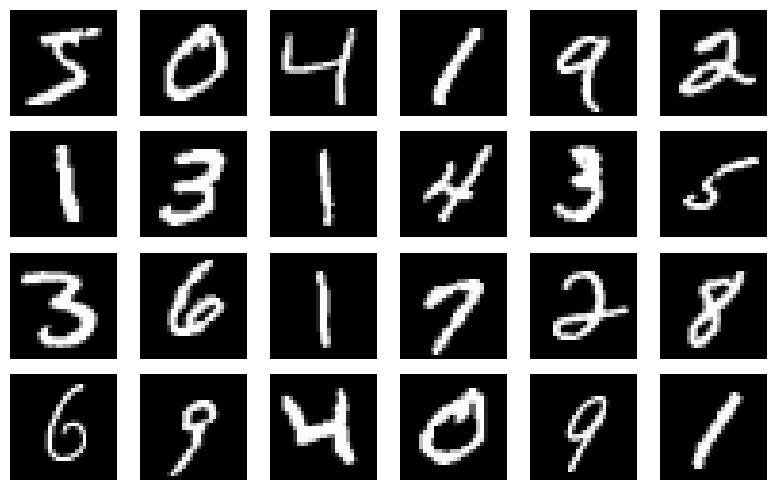

In [ ]:
from torchvision import datasets as tdatasets
from torchvision import transforms
import matplotlib.pyplot as plt

def get_mnist_data():
    mnist_train = tdatasets.MNIST(root='./data', train=True, download=True, transform=transforms.ToTensor())

    X_train = mnist_train.data.view(-1, 28*28).numpy()
    y_train = mnist_train.targets.numpy().astype(int)
    X_train = X_train / 255.

    batch = X_train[:24]
    fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(8, 5))
    for i, ax in enumerate(axes.flat):
        ax.imshow(batch[i].reshape(28, 28), cmap='gray')
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    return X_train, y_train

X_mnist, y_mnist = get_mnist_data()

In [ ]:
%%time
from umap.umap_ import UMAP
from sklearn.model_selection import train_test_split

X_mnist_train, X_mnist_test, labels_mnist_train, labels_mnist_test = train_test_split(
    X_mnist, y_mnist, test_size=50
)

model = UMAP(n_components=2).fit(X_mnist_train)
X_umap_train = model.transform(X_mnist_train)
X_umap_test = model.transform(X_mnist_test)

CPU times: user 3min 4s, sys: 8.94 s, total: 3min 13s
Wall time: 3min 14s


Text(0.5, 1.0, 'MNIST после применения UMAP')

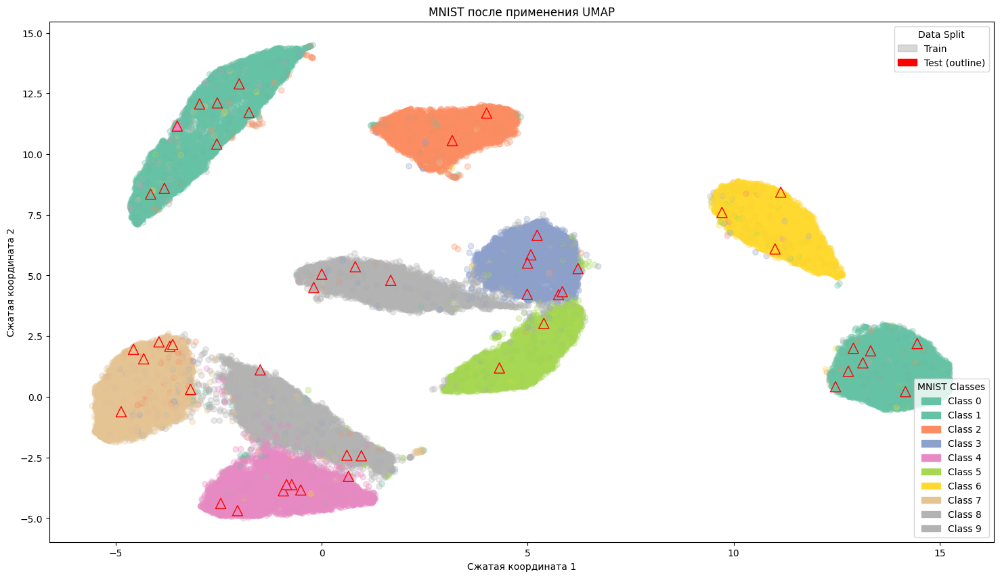

In [ ]:
import matplotlib.patches as mpatches

class_names = [str(i) for i in range(10)]

plt.figure(figsize=(18, 10))
scatter_train = plt.scatter(
    X_umap_train[:, 0], X_umap_train[:, 1],
    c=labels_mnist_train, label='Train', cmap='Set2', alpha=0.3
)
scatter_test = plt.scatter(
    X_umap_test[:, 0], X_umap_test[:, 1], s=120,
    c=labels_mnist_test, label='Test', marker='^',
    edgecolors='red', cmap='Set2'
)

# Legend 1: Train/Test markers
legend1 = plt.legend(handles=[
    mpatches.Patch(color='grey', alpha=0.3, label='Train'),
    mpatches.Patch(color='red', label='Test (outline)')
], loc='upper right', title='Data Split')
plt.gca().add_artist(legend1)
# Legend 2: MNIST class colors
scatter = scatter_train
handles = [
    mpatches.Patch(color=scatter.cmap(scatter.norm(i)), label=f'Class {class_names[i]}')
    for i in np.unique(labels_mnist_train)
]
plt.legend(handles=handles, loc='lower right', title='MNIST Classes')

plt.xlabel('Сжатая координата 1')
plt.ylabel('Сжатая координата 2')
plt.title('MNIST после применения UMAP')

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import classification_report

n_clusters = 10  # Since MNIST has 10 digits (0-9)
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
kmeans.fit(X_umap_train)

def map_clusters_to_labels(y_true, y_pred, n_clusters):
    mapping = {}
    for cluster in range(n_clusters):
        mask = y_pred == cluster
        labels, counts = np.unique(y_true[mask], return_counts=True)
        mapping[cluster] = labels[np.argmax(counts)]
    return mapping


cluster_to_label = map_clusters_to_labels(labels_mnist_train, kmeans.labels_, n_clusters)

test_clusters = kmeans.predict(X_umap_test)
y_pred_test = np.array([cluster_to_label[cluster] for cluster in test_clusters])

print("\nClassification Report:")
print(classification_report(labels_mnist_test, y_pred_test))


Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         7
           1       0.88      1.00      0.93         7
           2       1.00      1.00      1.00         2
           3       1.00      1.00      1.00         7
           4       0.78      0.88      0.82         8
           5       1.00      1.00      1.00         2
           6       1.00      1.00      1.00         3
           7       0.88      1.00      0.93         7
           8       1.00      1.00      1.00         4
           9       0.00      0.00      0.00         3

    accuracy                           0.92        50
   macro avg       0.85      0.89      0.87        50
weighted avg       0.87      0.92      0.89        50



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
from sklearn.metrics import rand_score, adjusted_rand_score, silhouette_score, davies_bouldin_score

In [ ]:
%%time
ri_score = rand_score(labels_mnist_test, y_pred_test)
ari_score = adjusted_rand_score(labels_mnist_test, y_pred_test)
print(f"Rand Index (RI): {ri_score:.4f}")
print(f"Adjusted Rand Index (ARI): {ari_score:.4f}")

Rand Index (RI): 0.9698
Adjusted Rand Index (ARI): 0.8466
CPU times: user 6.18 ms, sys: 20 µs, total: 6.2 ms
Wall time: 16.9 ms


In [ ]:
%%time
silhouette_avg = silhouette_score(X_umap_test, y_pred_test)
db_avg = davies_bouldin_score(X_umap_test, y_pred_test)

print(f"Silhouette Score: {silhouette_avg:.4f}")
print(f"Davies Bouldin Score: {db_avg:.4f}")

Silhouette Score: 0.6561
Davies Bouldin Score: 0.4260
CPU times: user 10.8 ms, sys: 997 µs, total: 11.8 ms
Wall time: 11.5 ms


### Integer visualization

Source - https://johnhw.github.io/umap_primes/index.md.html, https://github.com/BielStela/prime_factors/blob/master/prime_factors.ipynb

Число - это число)

Т.е. $x \in \mathbb{R}^1$. Как тогда представлять числа высокоразмерными данными?

Разложение на простые множители!

Памяти колаба не хватает для построения графа, поэтому посмотрим на финальный результат

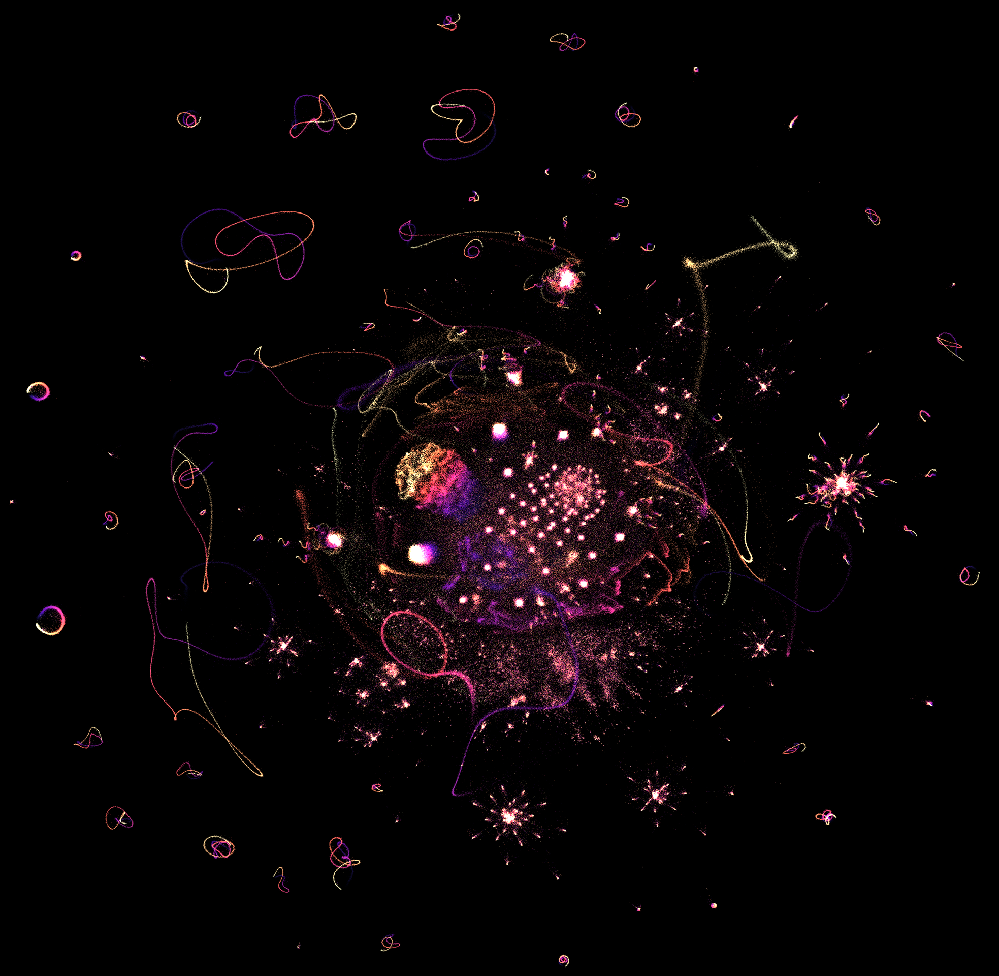

In [ ]:
Image('https://johnhw.github.io/umap_primes/imgs/primes_umap_1e6_contrast_enhanced.png', width=800)

# SVM






### Интуиция метода опорных векторов

На рисунке представлена линейно-разделимая выборка. Слева изображены 2 прямые (гиперплоскости), разделяющие её. *Интуитивно*, синяя прямая лучше разделяет обучающую выборку, так как расстояние от объектов до до неё больше, чем для красной и она лучше будет разделять другие примеры из того же распределения. То есть такой линейный классификатор будет лучше обобщаться на новые данные. Теория подтверждает описанную интуицию [[1](https://www.academia.edu/download/86186744/lecture_3.pdf)].

*Метод опорных векторов (Support Vector Machine, SVM)* основан на идее построения оптимального разделения между классами.

In [ ]:
Image(url='https://quantum-ods.github.io/qmlcourse/_images/linclass_margins.png', width=1000)

### Построение оптимизационной задачи

In [ ]:
Image(url='https://quantum-ods.github.io/qmlcourse/_images/distance_to_the_plane.png', width=1000)

Расстояние от точки $x_A$ до плоскости $\langle w,x \rangle = 0$:
$$
\rho(x^A, \langle w,x \rangle = 0) = \dfrac{\langle w,x^A \rangle}{\|w\|}
$$

Рассмотрим линейный классификатор $a(x) = sign(\langle w,x \rangle + b)$, $w \in \mathbb{R}^d, b \in \mathbb{R}$. Без ограничения общности положим $\min_{x\in X}|\langle w,x \rangle + b| = 1$. В противном случае соответствующим образом отнормируем параметры классификатора.

Расстояние от выборки X до гиперплоскости:
$$
\rho(X, a) = \min_{x \in X}\rho(x, a) = \dfrac{\min_{x\in X}|\langle w,x \rangle + b|}{\|w\|} = \dfrac{1}{\|w\|}
$$

Тогда, оптимизация строится вокруг максимизации зазора при условии корректного разделения:
$$
\begin{cases}
\dfrac{1}{2}\|w\|^2 \rightarrow \min_{w, b} \\
y_i(\langle w,x_i \rangle + b) \geqslant 1, & i=1,\ldots, l.
\end{cases}
$$
Выражение $M(x_i, y_i, w) = y_i\langle w,x_i\rangle$ называют **отступом классификации** (margin).

Если выборка линейно-неразделимая, то $\exists\, x_i \in X: y_i(\langle w,x_i \rangle + b) < 1$. Давайте *смягчим* ограничение, введя штраф $\xi_i$.
$$
\begin{cases}
\dfrac{1}{2}\|w\|^2 + C \sum_{i=1}^\ell \xi_i\rightarrow \min_{w, b, \xi} \\
y_i(\langle w,x_i \rangle + b) \geqslant 1 - \xi_i, & i=1,\ldots, \ell, \\
\xi_i \geqslant 0, & i=1,\ldots, \ell.
\end{cases} \tag{1}
$$

Полученная система является задачей *условной оптимизации*, её можно решить через условия *Каруша-Куна-Таккера*.

Решение задачи зависит от конкретных значений параметров системы. Их можно разбить на 3 категории, интерпретируемых через расстояние примера обучающей выборки до разделяющей гиперплоскости:


*   *Периферийный пример*
*   *Опорный граничный пример*
*   *Опорный нарушитель-пример*





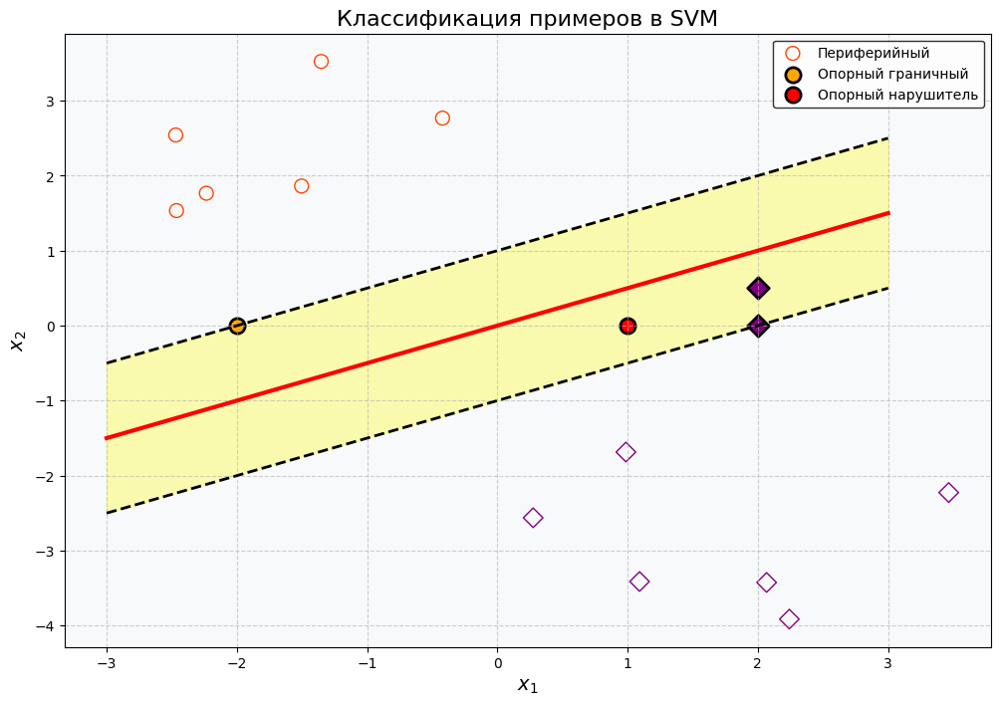

In [ ]:
np.random.seed(42)
class_1 = np.random.randn(6, 2) + [-2, 2]
class_2 = np.random.randn(6, 2) + [2, -2]

support_bound_class_1 = [-2.0, 0.0]
support_bound_class_2 = [2.0, 0.0]
support_error_class_1 = [1.0, 0.0]
support_correct_class_2 = [2.0, 0.5]

x_vals = np.linspace(-3, 3, 100)
decision_boundary = 0.5 * x_vals
margin_up = 0.5 * x_vals + 1
margin_down = 0.5 * x_vals - 1

fig, ax = plt.subplots(figsize=(12, 8))
ax.set_facecolor("#f8f9fa")

ax.scatter(class_1[:, 0], class_1[:, 1], s=100, facecolors="none", edgecolors="orangered", label="Периферийный")
ax.scatter(class_2[:, 0], class_2[:, 1], s=100, facecolors="none", edgecolors="purple", marker="D")

ax.plot(x_vals, decision_boundary, "r-", linewidth=3)
ax.plot(x_vals, margin_up, "k--", linewidth=2)
ax.plot(x_vals, margin_down, "k--", linewidth=2)
ax.fill_between(x_vals, margin_down, margin_up, color="yellow", alpha=0.3)

ax.scatter(support_bound_class_1[0], support_bound_class_1[1], s=120, facecolors="orange", edgecolors="black", label="Опорный граничный", linewidth=2)
ax.scatter(support_bound_class_2[0], support_bound_class_2[1], s=120, facecolors="purple", edgecolors="black", linewidth=2, marker="D")
ax.scatter(support_error_class_1[0], support_error_class_1[1], s=120, facecolors="red", edgecolors="black", label="Опорный нарушитель", linewidth=2)
ax.scatter(support_correct_class_2[0], support_correct_class_2[1], s=120, facecolors="purple", edgecolors="black", linewidth=2, marker="D")

ax.set_xlabel(r"$x_1$", fontsize=14)
ax.set_ylabel(r"$x_2$", fontsize=14)
ax.set_title("Классификация примеров в SVM", fontsize=16)
ax.legend(loc="upper right", fontsize=10, frameon=True, edgecolor="black")
ax.grid(True, linestyle="--", alpha=0.6)

#### Как полученная система уравнений связана с линейным классификатором?

https://education.yandex.ru/handbook/ml/article/linear-models

Давайте вспомним задачу линейной классификации
$$
\dfrac{1}{N} \sum_{i=1}^N \mathbb{I}[M_i < 0] → \min_{w}
$$
Полученный функционал является кусочно-постоянным, его аппроксимируют гладкой функцией. Рассмотрим hinge-loss $\max\{0, 1 - M_i\}$ с $\ell_2$-регуляризацией:
$$
\dfrac{1}{N} \sum_{i=1}^N \max\{0, 1 - y_i(\langle w, x_i\rangle + b)\} + \dfrac{\alpha}{2}\|w\|^2 → \min_{w, b}
$$
Систему ограничений $y_i(\langle w,x_i \rangle + b) \geqslant 1 - \xi_i,\,\,\, i=1,\ldots, \ell$, $\,\,\,\xi_i \geqslant 0$ можно аппроксимировать как $\xi_i = \max\{0, 1 - y_i(\langle w, x_i\rangle + b)\}$. Тогда систему (1) можно переписать:
$$
\dfrac{1}{2}\|w\|^2 + C \sum_{i=1}^\ell\max\{0, 1 - y_i(\langle w, x_i\rangle + b)\} \rightarrow \min_{w, b},
$$
что с точностью до домножения на $\frac{1}{CN}$ и переобозначения $\alpha = \frac{1}{CN}$ эквивалентно задаче линейного классификатора с hinge-лосс функцией потерь.

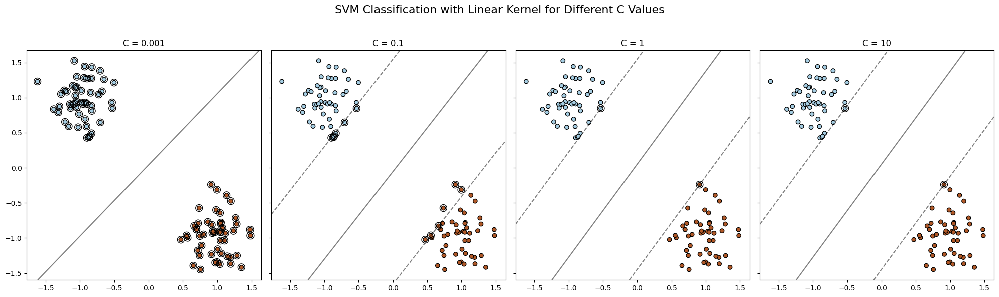

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler

# Generate a simple two-class dataset
X, y = make_blobs(n_samples=100, centers=2, random_state=42, cluster_std=1.0)
X = StandardScaler().fit_transform(X)
# List of different C values to test
C_values = [0.001, 0.1, 1, 10]

# Create subplots: one plot for each C value
fig, axes = plt.subplots(1, len(C_values), figsize=(20, 6), sharex=True, sharey=True)

for ax, C in zip(axes, C_values):
    # Train SVM with a given C value
    svm_classifier = SVC(kernel='linear', C=C)
    svm_classifier.fit(X, y)

    # Plot the training points
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Paired, edgecolors='k')

    # Plot support vectors
    ax.scatter(svm_classifier.support_vectors_[:, 0],
               svm_classifier.support_vectors_[:, 1],
               s=100, linewidth=1, facecolors='none', edgecolors='k')

    # Get current axes limits
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    # Create grid to evaluate the model
    xx = np.linspace(xlim[0], xlim[1], 30)
    yy = np.linspace(ylim[0], ylim[1], 30)
    YY, XX = np.meshgrid(yy, xx)
    xy = np.vstack([XX.ravel(), YY.ravel()]).T

    # Evaluate decision function over the grid
    Z = svm_classifier.decision_function(xy).reshape(XX.shape)

    # Plot decision boundary and margins
    ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1],
               alpha=0.5, linestyles=['--', '-', '--'])

    ax.set_title(f"C = {C}")

plt.suptitle("SVM Classification with Linear Kernel for Different C Values", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


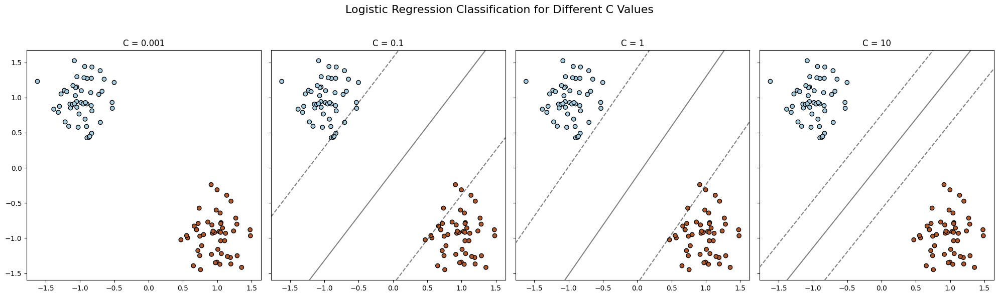

In [ ]:
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler

# Generate a simple two-class dataset
X, y = make_blobs(n_samples=100, centers=2, random_state=42, cluster_std=1.0)
X = StandardScaler().fit_transform(X)
y = np.where(y == 0, -1, 1)  # Convert labels to {-1, 1}

# List of different regularization strengths (inverse of C)
C_values = [0.001, 0.1, 1, 10]

# Create subplots: one plot for each C value
fig, axes = plt.subplots(1, len(C_values), figsize=(20, 6), sharex=True, sharey=True)

for ax, C in zip(axes, C_values):
    # Train Logistic Regression with a given regularization strength
    logreg_classifier = SGDClassifier(loss="hinge", alpha=1/(C*X.shape[0]))
    logreg_classifier.fit(X, y)

    # Plot the training points
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Paired, edgecolors='k')

    # Get current axes limits
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    # Create grid to evaluate the model
    xx = np.linspace(xlim[0], xlim[1], 30)
    yy = np.linspace(ylim[0], ylim[1], 30)
    YY, XX = np.meshgrid(yy, xx)
    xy = np.vstack([XX.ravel(), YY.ravel()]).T

    # Evaluate decision function over the grid
    Z = logreg_classifier.decision_function(xy).reshape(XX.shape)

    # Plot decision boundary and margins
    # ax.contour(XX, YY, Z, colors='k', levels=[0.5], alpha=0.5,
    #            linestyles=['-'])
    ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1],
               alpha=0.5, linestyles=['--', '-', '--'])

    ax.set_title(f"C = {C}")

plt.suptitle("Logistic Regression Classification for Different C Values", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### SVM unbalanced case

Давайте аналогично взвешиванию функции потерь взвешивать вклады от $\xi_i$ для разных $y_i$:
$$
\dfrac{1}{2}\|w\|^2 + C_1 \sum_{y_i = 1} \xi_i + C_2 \sum_{y_i = -1} \xi_i\rightarrow \min_{w, b, \xi}.
$$

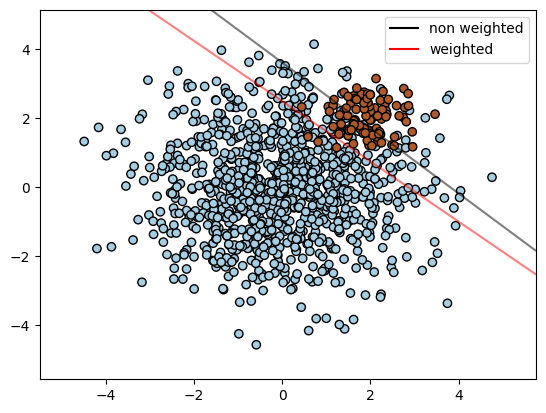

In [ ]:
# Authors: The scikit-learn developers
# SPDX-License-Identifier: BSD-3-Clause

import matplotlib.lines as mlines
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.datasets import make_blobs
from sklearn.inspection import DecisionBoundaryDisplay

# we create two clusters of random points
n_samples_1 = 1000
n_samples_2 = 100
centers = [[0.0, 0.0], [2.0, 2.0]]
clusters_std = [1.5, 0.5]
X, y = make_blobs(
    n_samples=[n_samples_1, n_samples_2],
    centers=centers,
    cluster_std=clusters_std,
    random_state=0,
    shuffle=False,
)

# fit the model and get the separating hyperplane
clf = svm.SVC(kernel="linear", C=1.0)
clf.fit(X, y)

# fit the model and get the separating hyperplane using weighted classes
wclf = svm.SVC(kernel="linear", class_weight={1: n_samples_1 / n_samples_2})
wclf.fit(X, y)

# plot the samples
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Paired, edgecolors="k")

# plot the decision functions for both classifiers
ax = plt.gca()
disp = DecisionBoundaryDisplay.from_estimator(
    clf,
    X,
    plot_method="contour",
    colors="k",
    levels=[0],
    alpha=0.5,
    linestyles=["-"],
    ax=ax,
)

# plot decision boundary and margins for weighted classes
wdisp = DecisionBoundaryDisplay.from_estimator(
    wclf,
    X,
    plot_method="contour",
    colors="r",
    levels=[0],
    alpha=0.5,
    linestyles=["-"],
    ax=ax,
)

plt.legend(
    [
        mlines.Line2D([], [], color="k", label="non weighted"),
        mlines.Line2D([], [], color="r", label="weighted"),
    ],
    ["non weighted", "weighted"],
    loc="upper right",
)
plt.show()

### Двойственная задача

Двойственность по Лагранжу:
$$
\max_{\lambda \geqslant 0} G(\lambda), \quad G(\lambda) = \inf_{x \in S_n(1)} ℒ(x, \lambda).
$$
$G(\lambda)$ - двойственная функция, $ℒ(x, \lambda)$ - функция Лагранжа.

Интуитивно, *двойственная функция* показывает, как изменяется оптимальное решение исходной задачи при *возмущении* ограничений.

*Двойственная задача* ищет такие возмущения, которые отражают наибольшие изменения оптимального решения.

В методе опорных векторов ограничениями оптимизационной задачи являются неравенства:
$$
y_i(\langle w,x_i \rangle + b) \geqslant 1 - \xi_i
$$

Для *периферийных* примеров $y_i(\langle w,x_i \rangle + b) > 1$, таким образом, возмущение ограничений отражается только на *опорных* примерах.

Двойственная задача в методе опорных векторов:
$$
\begin{cases}
\sum_{i=1}^\ell \lambda_i - \dfrac{1}{2}\sum_{i,j=1}^\ell \lambda_i\lambda_j y_i y_j \langle x_i, x_j\rangle \rightarrow \max_{\lambda} \\
0 \leqslant \lambda_i \leqslant C, \quad i=1,\ldots, \ell, \\
\sum_{i=1}^\ell \lambda_i y_i = 0.
\end{cases} \tag{1}
$$

Интуиция подтверждается решением: $\lambda_i = 0$ для всех $i$: $y_i(\langle w,x_i \rangle + b) > 1$.

### Переход в спрямляющее пространство

Одним из важнейших свойств метода опорных векторов является независимость двойственной задачи (1) от отдельных признаковых описаний $x_i$: в задаче присутствуют только скалярные произведения $\langle x_i, x_j\rangle$.

В таком случае, мы можем выполнить преобразование $\langle x_i, x_j\rangle \rightarrow \mathcal{K}(x_i, x_j)$, т.е. перейти *в спрямляющее пространство*.

In [ ]:
Image(url='https://shorturl.at/zE135', width=600)

Для этого необходимо, чтобы функция $\mathcal{K}(x_i, x_j)$ была **ядром** (англ. kernel):
$$
\mathcal{K}: \mathcal{X}\times\mathcal{X} \rightarrow \mathbb{R}, \quad \mathcal{K}(x_i, x_j) = \langle \psi(x_i), \psi(x_j) \rangle,
$$
при некотором $\psi: \mathcal{X} \rightarrow H$, где $H$ - пространство со скалярным произведением.

Примеры распространённых ядерных функций:
* Константа $ \mathcal{K}_{C}(x,y) = C$;
* Линейное $\mathcal{K}_{L}(x,y) =  x^\top y$;
* Полиномиальное $\mathcal{K}_{d, c}(x,y) = (x^\top y + c)^d$;
* Радиально-Базисная Функция (РБФ) $\mathcal{K}_\gamma(x, y) = \exp\left\{\gamma\|x-y\|^2\right\}$;
* Сигмоида $\mathcal{K}_{c}(x,y) = \tanh{(x^\top y + c)}$

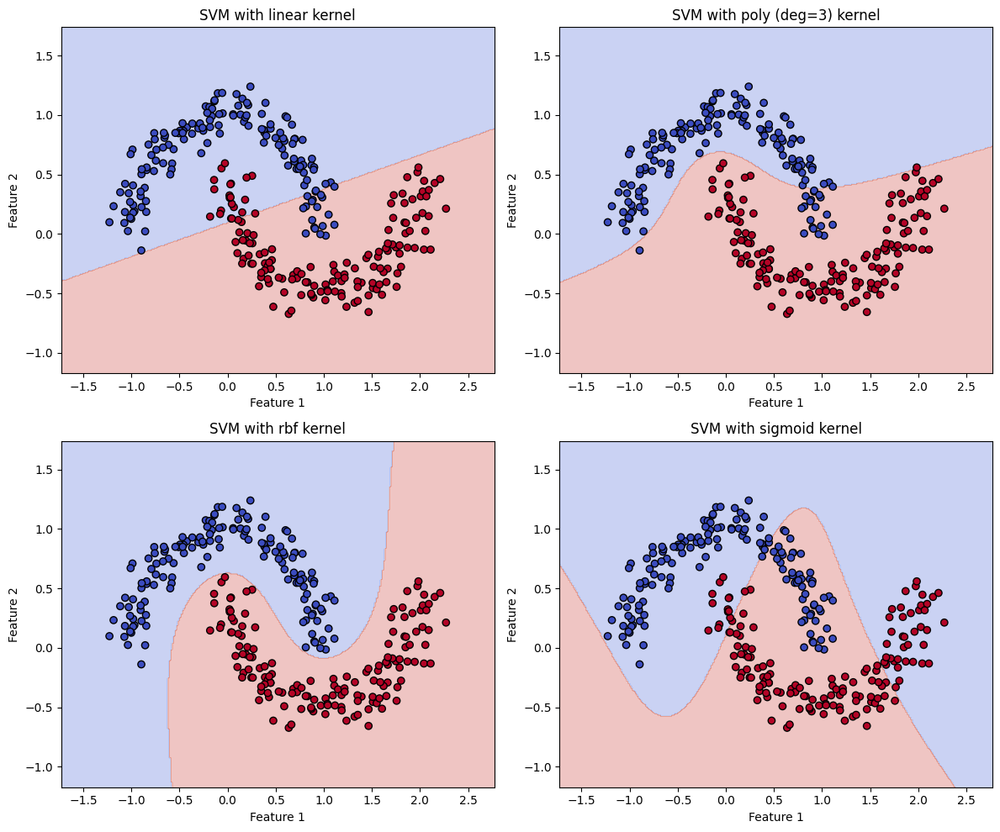

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.svm import SVC

# Generate the two moons dataset
X, y = make_moons(n_samples=300, noise=0.1, random_state=42)

# Define different kernels to compare
kernels = {
    'linear': SVC(kernel="linear", C=1.0, gamma='scale'),
    'poly (deg=3)': SVC(kernel="poly", degree=3, C=1.0, gamma='scale'),
    'rbf': SVC(kernel="rbf", C=1.0, gamma='scale'),
    'sigmoid': SVC(kernel="sigmoid", C=1.0, gamma='scale')
}

# Fit each model
for name, model in kernels.items():
    model.fit(X, y)

# Function to plot decision boundaries
def plot_decision_boundary(model, X, y, ax, title):
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 300),
                         np.linspace(y_min, y_max, 300))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

    ax.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.coolwarm)
    ax.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', cmap=plt.cm.coolwarm)
    ax.set_title(title)
    ax.set_xlabel("Feature 1")
    ax.set_ylabel("Feature 2")

# Plot decision boundaries for each kernel
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()
for i, (name, model) in enumerate(kernels.items()):
    plot_decision_boundary(model, X, y, axes[i], f"SVM with {name} kernel")
plt.tight_layout()

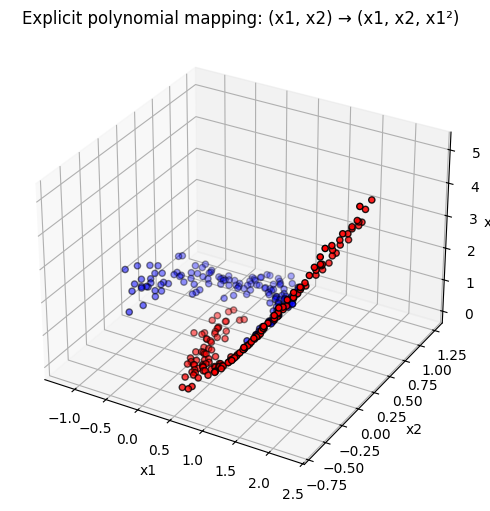

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from mpl_toolkits.mplot3d import Axes3D  # needed for 3D plotting

# Create a polynomial feature transformer (degree 2)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X)
# The transformed features are in order: [x1, x2, x1^2, x1*x2, x2^2]

# For visualization purposes, let’s plot the first three dimensions:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(X_poly[:, 0], X_poly[:, 1], X_poly[:, 2], c=y, cmap=plt.cm.bwr, edgecolor='k')
ax.set_xlabel("x1")
ax.set_ylabel("x2")
ax.set_zlabel("x1^2")
ax.set_title("Explicit polynomial mapping: (x1, x2) → (x1, x2, x1²)")
plt.show()


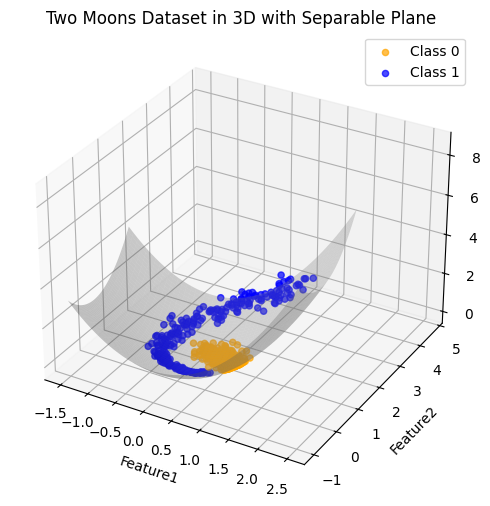

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import PolynomialFeatures

# Step 1: Generate the two moons dataset
X, y = make_moons(n_samples=500, noise=0.1, random_state=42)

poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X) # The transformed features are in order: [x1, x2, x1^2, x1*x2, x2^2]

# Step 2: Add a third dimension
X_3d = np.c_[X_poly[:, 1], X_poly[:, 2], X_poly[:, 4]]

# Step 3: Plot the 3D scatter plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for each class
for label, color in zip([0, 1], ['orange', 'blue']):
    ax.scatter(
        X_3d[y == label, 0],
        X_3d[y == label, 1],
        X_3d[y == label, 2],
        label=f'Class {label}',
        color=color,
        alpha=0.7
    )

# Step 4: Plot the separable plane (z = x^2 + y^2)
x = np.linspace(-1.5, 2.5, 50)
y = np.linspace(-1.0, 1.5, 50)
x_grid, y_grid = np.meshgrid(x, y)
z_plane = x_grid**2 + y_grid**2

ax.plot_surface(x_grid, y_grid, z_plane, alpha=0.3, color='gray')

# Step 5: Customize plot
ax.set_xlabel('Feature1')
ax.set_ylabel('Feature2')
ax.set_zlabel('Feature3 (z)')
ax.legend()
plt.title("Two Moons Dataset in 3D with Separable Plane")
plt.show()

### Операции с функциями ядра

На практике можно строить более сложные - композиционные ядровые функции.
Построение композиций основано на следующем утверждении:
- Сумма ядровых функций - ядровая функция:
$$\mathcal{K}(x, x') = \mathcal{K}_1(x, x') + \mathcal{K}_2(x, x')$$
- Произведение ядровых функций - ядровая функция:
$$\mathcal{K}(x, x') = \mathcal{K}_1(x, x') \cdot \mathcal{K}_2(x, x')$$

Доказательство утверждения основано на [теорема Мерсера](https://en.wikipedia.org/wiki/Mercer%27s_theorem):

Функция $\mathcal{K}(x, x')$ является ядром тогда и только тогда, когда выполнены условия:
$$
\begin{cases}
\mathcal{K}(x, x') = \mathcal{K}(x', x ) & \text{(Симметричность)} \\
\forall\, g: \mathcal{X} \rightarrow \mathbb{R} \quad \int\limits_{\mathcal{X}}\int\limits_{\mathcal{X}}\mathcal{K}(x', x )g(x)g(x')dxdx' \geqslant 0 & \text{(неотрицательная определённость)}
\end{cases}
$$

1. **Сумма ядровых функций**

Симметричность
$$
\mathcal{K}(x, x') = \mathcal{K}_1(x, x') + \mathcal{K}_2(x, x') \stackrel{th. Mercer}{=} \mathcal{K}_1(x', x) + \mathcal{K}_2(x', x) \stackrel{def}{=} \mathcal{K}(x', x)
$$
Неотриц. определённость (дискретный случай)
$$
\lambda\mathcal{K}(x, x')\lambda^\top = \lambda\left(\mathcal{K}_1(x, x') + \mathcal{K}_2(x, x')\right)\lambda^\top = \lambda\mathcal{K}_1(x, x')\lambda^\top + \lambda\mathcal{K}_1(x, x')\lambda^\top \stackrel{th. Mercer}{\geqslant} 0 + 0 = 0
$$
Таким образом, по теореме Мерсера, сумма ядровых функций -- ядровая функция

2. **Произведение ядровых функций**

Покажем по определению:

$\mathcal{K}_1(x, x') = \langle \phi(x), \phi(x') \rangle$, $\mathcal{K}_2(x, x') = \langle \psi(x), \psi(x') \rangle$.
$$
\mathcal{K}(x, x') = \left(\sum_{m=1}^M \phi_m(x) \phi_m(x') \right) \left(\sum_{n=1}^N \psi_n(x) \psi_n(x') \right) \equiv \sum_{m=1}^M\sum_{n=1}^N \xi_{mn}(x) \xi_{mn}(x') = \langle \xi(x), \xi(x') \rangle,
$$
где $\xi_{mn}(x): \mathcal{X} → H$,  $\,\,\xi_{mn}(x)= \phi_m(x)\psi_n(x)$

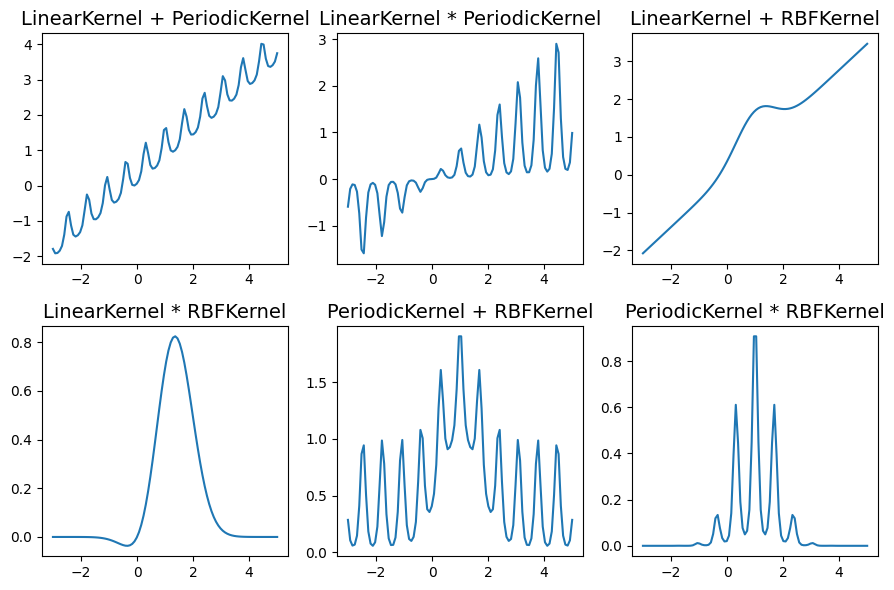

In [ ]:
from gpytorch import kernels
import torch

def plot_kernel(kernel, xlim=None, ax=None):
    if xlim is None:
        xlim = [-3, 5]
    x = torch.linspace(xlim[0], xlim[1], 100)
    with torch.no_grad():
        K = kernel(x, torch.ones((1))).evaluate().reshape(-1, 1)

    if ax is None:
        fig = plt.figure()
        ax = fig.add.subplot(111)
    ax.plot(x.numpy(), K.cpu().numpy())

covariance_functions = [kernels.LinearKernel(power=1), kernels.PeriodicKernel(),
                        kernels.RBFKernel()]

operations = {'+': lambda x, y: x + y,
              '*': lambda x, y: x * y}

figure, axes = plt.subplots(len(operations), len(covariance_functions), figsize=(9, 6))

axes = axes.ravel()
count = 0
for j, base_kernels in enumerate(itertools.combinations(covariance_functions, 2)):
    for k, (op_name, op) in enumerate(operations.items()):
        kernel = op(base_kernels[0], base_kernels[1])
        plot_kernel(kernel, ax = axes[count])
        kernel_names = [str(base_kernels[i]).split('(')[0] for i in [0, 1]]
        axes[count].set_title('{} {} {}'.format(kernel_names[0], op_name, kernel_names[1]), fontsize=14)

        count += 1
figure.tight_layout()

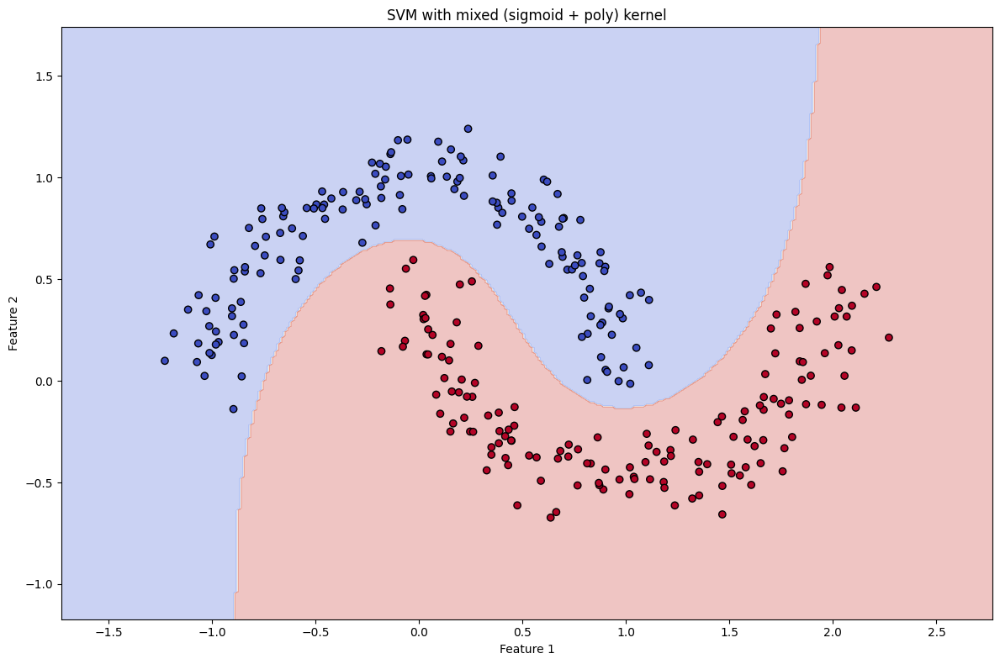

In [ ]:
# Generate the two moons dataset
X, y = make_moons(n_samples=300, noise=0.1, random_state=42)

def mixed_kernel_sigm_poly(X, Y):
    degree = 3   # degree for polynomial part; adjust as needed
    coef0 = 1
    poly = (np.dot(X, Y.T) + coef0) ** degree
    sigmoid = np.tanh(np.dot(X, Y.T) + coef0)
    return sigmoid + poly

svc_model = SVC(kernel=mixed_kernel_sigm_poly, C=1.0)
svc_model.fit(X, y)

fig, axis = plt.subplots(1, figsize=(12,8))
plot_decision_boundary(svc_model, X, y, axis, f"SVM with mixed (sigmoid + poly) kernel")
plt.tight_layout()

### Support Vector Regression

Вспомним оптимизационную задачу для Support Vector Machine (Классификация)
$$
\begin{cases}
\dfrac{1}{2}\|w\|^2 + C \sum_{i=1}^\ell \xi_i\rightarrow \min_{w, b, \xi} \\
y_i(\langle w,x_i \rangle + b) \geqslant 1 - \xi_i, & i=1,\ldots, \ell, \\
\xi_i \geqslant 0, & i=1,\ldots, \ell.
\end{cases}
$$
Ограничениями задачи являлся "мягкий порог" (англ. soft-margin) $y_i(\langle w,x_i \rangle + b) \geqslant 1 - \xi_i$.

В задаче регрессии мы смотрим на модуль разницы $|y_i - (\langle w,x_i \rangle + b)|$ -- MAE-функция потерь. Мы определяем значение $\varepsilon$, относительно которого модель нечувствительна к ошибкам. Аналогично классификации, мы стремимся минимизировать $\|w\|^2$.

### SVR on Parkinson desease detection

Эксперименты воспроизводят результаты статьи: https://pmc.ncbi.nlm.nih.gov/articles/PMC9543766

[Данные](https://archive.ics.uci.edu/dataset/189/parkinsons+telemonitoring) представляют собой характеристики голосовой записи пациентов с болезнью Паркинсона.

В выборке представлено 42 пациента с $\sim 200$ записей на каждого. Целевым показателем является [Unified Parkinson's disease rating sacle (UPDRS)](https://en.wikipedia.org/wiki/Unified_Parkinson%27s_disease_rating_scale).

In [ ]:
!pip install ucimlrepo

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
parkinsons_telemonitoring = fetch_ucirepo(id=189)

# data (as pandas dataframes)
X = parkinsons_telemonitoring.data.features
y = parkinsons_telemonitoring.data.targets

X.columns

Index(['age', 'test_time', 'Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP',
       'Jitter:PPQ5', 'Jitter:DDP', 'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3',
       'Shimmer:APQ5', 'Shimmer:APQ11', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE',
       'DFA', 'PPE', 'sex'],
      dtype='object')

In [ ]:
X

,age,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE,sex
0,72,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006,0
1,72,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810,0
2,72,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014,0
3,72,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277,0
4,72,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5870,61,142.7900,0.00406,0.000031,0.00167,0.00168,0.00500,0.01896,0.160,0.00973,0.01133,0.01549,0.02920,0.025137,22.369,0.64215,0.55314,0.21367,0
5871,61,149.8400,0.00297,0.000025,0.00119,0.00147,0.00358,0.02315,0.215,0.01052,0.01277,0.01904,0.03157,0.011927,22.886,0.52598,0.56518,0.12621,0
5872,61,156.8200,0.00349,0.000025,0.00152,0.00187,0.00456,0.02499,0.244,0.01371,0.01456,0.01877,0.04112,0.017701,25.065,0.47792,0.57888,0.14157,0
5873,61,163.7300,0.00281,0.000020,0.00128,0.00151,0.00383,0.01484,0.131,0.00693,0.00870,0.01307,0.02078,0.007984,24.422,0.56865,0.56327,0.14204,0


In [ ]:
y

,motor_UPDRS,total_UPDRS
0,28.199,34.398
1,28.447,34.894
2,28.695,35.389
3,28.905,35.810
4,29.187,36.375
...,...,...
5870,22.485,33.485
5871,21.988,32.988
5872,21.495,32.495
5873,21.007,32.007


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

y = y["total_UPDRS"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

Как можно отметить на визуализациях, при комбинировании ядер одно отвечает за локальные, а второе за глобальные изменения (local and global kernels). RBF является типичным представителем глобального ядра, а Poly -- локального.

#### SVR with Rbf

In [ ]:
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error

svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.1)
svr_model.fit(X_train_scaled, y_train.values)
y_pred = svr_model.predict(X_test_scaled)
mean_absolute_error(y_test, y_pred)

6.615077608234632

#### SVR with (Rbf + Poly)

In [ ]:
from sklearn.metrics.pairwise import euclidean_distances

beta1 = 0.5
beta2 = 0.5

def mixed_kernel_sum(X, Y):
    gamma = 0.1  # adjust as needed
    rbf = np.exp(-gamma * euclidean_distances(X, Y, squared=True))
    degree = 2   # degree for polynomial part; adjust as needed
    coef0 = 1
    poly = (np.dot(X, Y.T) + coef0) ** degree
    return beta1*rbf + beta2*poly

svr_model = SVR(kernel=mixed_kernel_sum, C=1.0, epsilon=0.1)
svr_model.fit(X_train_scaled, y_train.values)
y_pred = svr_model.predict(X_test_scaled)
mean_absolute_error(y_test, y_pred)

6.421222064687206

#### SVR with (Rbf * Poly)

In [ ]:
def mixed_kernel_prod(X, Y):
    gamma = 0.1  # adjust as needed
    rbf = np.exp(-gamma * euclidean_distances(X, Y, squared=True))
    degree = 2   # degree for polynomial part; adjust as needed
    coef0 = 1
    poly = (np.dot(X, Y.T) + coef0) ** degree
    return rbf * poly

svr_model = SVR(kernel=mixed_kernel_prod, C=1.0, epsilon=0.1)
svr_model.fit(X_train_scaled, y_train.values)
y_pred = svr_model.predict(X_test_scaled)
mean_absolute_error(y_test, y_pred)

4.3065434294441705